In [1]:
import os
import cv2
import glob
import numpy as np
import pandas as pd

import scipy.ndimage as scn
import astropy.stats as aps
import astropy.io.fits as pf
from astropy.time import Time

from datetime import datetime
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.ticker as ticker

from skyfield.units import Angle
from skyfield.api import load, wgs84, EarthSatellite 

rootdir = '/Users/peter/Projects/starlink_data/'
testdir = rootdir + 'test_data/'
savedir = rootdir + 'images/thesis/'
datadir = rootdir + 'full_data/'

# plt.rcParams.update(plt.rcParamsDefault)
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = ['Tahoma']
plt.rcParams['font.size'] = 20  

# %matplotlib qt

In [85]:
passages = pd.read_pickle(f'{rootdir}original_passages/passages_20221023LSC.p')

In [92]:
df_starlink = get_starlink_launches()

In [106]:
len(df_starlink)

3173

In [141]:
# N images

files = sorted(glob.glob(f'{datadir}passages_*.p'))
for f in files:
    count = 0
    camid = f[-5:-2]
    p = pd.read_pickle(f)
    
    for lstseq in p.keys():
        for satnum in df_starlink.satnum:
            if satnum in p[lstseq]:
                count += 1
                break
                
    print(camid, count)
    
    
# files = sorted(glob.glob(f'{rootdir}passages_all_sats/passages_*.p'))

LSC 4092
LSE 4492
LSN 4492
LSS 4492
LSW 4492


In [140]:
4492*5

22460

In [132]:
# Quality images

neg_count = 0
total = 0
files = sorted(glob.glob(f'{datadir}vmags_july/*.p'))
for f in files:
    count = 0
    camid = f[-5:-2]
    p = pd.read_pickle(f)
    
    for lstseq in p.keys():
        for satnum in df_starlink.satnum:
            if satnum in p[lstseq]:
                count += 1
                break
                
        if len(list(p[lstseq])[2:]) == 0:
            neg_count += 1
                
    print(camid, count)
    total += count
    
print('Total:', total)
print(neg_count)

LSC 149
LSE 300
LSN 90
LSS 377
LSW 366
Total: 1282
1737


In [121]:
# N starlinks in quality images

total = 0
files = sorted(glob.glob(f'{datadir}vmags_july/*.p'))
for f in files:
    count = 0
    camid = f[-5:-2]
    p = pd.read_pickle(f)
    
    for lstseq in p.keys():
        for satnum in df_starlink.satnum:
            if satnum in p[lstseq]:
                count += 1
                
    print(camid, count)
    total += count
    
print('Total:', total)

LSC 167
LSE 422
LSN 109
LSS 450
LSW 457
Total: 1605


In [8]:
imgs = glob.glob(f'{testdir}raw_images/*.fits.gz')
fig, axes = plt.subplots(1,2,figsize=[10,6])
for img, ax in zip(imgs, axes.flat):
    data = pf.getdata(img) 
    ax.imshow(np.fabs(data), interpolation="none", vmin=1000, vmax=2000)
    ax.axis('off')
plt.tight_layout()
plt.show()

In [9]:
def prep_image(lstseq):
    
    data, header = pf.getdata(f'{datadir}diff_images/LSC/diff_{lstseq}LSC.fits.gz', header=True)
    mean, median, sigma = aps.sigma_clipped_stats(np.abs(data))
    data[data >= 0.9*65535] = median

    lx = header['X0']
    nx_image = header['XSIZE']
    ux = lx + nx_image
    ly = header['Y0']
    ny_image = header['YSIZE']
    uy = ly + ny_image
    
    return data[ly:uy,lx:ux]

In [238]:
camid = 'LSC'
lstseq = '48506263'

data, header = pf.getdata(f'{testdir}raw_images/{lstseq}{camid}.fits.gz', header=True)
mean, median, sigma = aps.sigma_clipped_stats(np.abs(data))
data[data >= 0.9*65535] = median

lx = header['X0']
nx_image = header['XSIZE']
ux = lx + nx_image
ly = header['Y0']
ny_image = header['YSIZE']
uy = ly + ny_image
lst = header['LST']
JD = header['JD']

# RAW IMAGE 
plt.figure(figsize=[10,6])
# plt.imshow(np.fabs(data[ly:uy,lx:ux]), interpolation="none", vmin=1000, vmax=2000., cmap='binary_r')
plt.imshow(np.fabs(data[ly:uy,lx:ux]), interpolation="none", cmap='binary_r', 
           norm=colors.LogNorm(vmin=1000, vmax=2000))
plt.axis('off')
plt.tight_layout()
plt.savefig(f'{savedir}raw_img_log.png', bbox_inches='tight', dpi=300)
# plt.savefig(f'{savedir}raw_img.pdf', format="pdf", bbox_inches="tight")
plt.show()

In [12]:
# RAW IMAGE WITH SATELLITES

plt.figure(figsize=[10,6])
plt.imshow(np.fabs(data[ly:uy,lx:ux]), interpolation="none", vmin=1000, vmax=2000.)

count = 0
for sat in list(passages[JD].keys()):
    count += 1
    
    x_start = np.float64(passages[JD][sat]['start']['x0'])
    y_start = np.float64(passages[JD][sat]['start']['y0'])
    x_end = np.float64(passages[JD][sat]['end']['x0'])
    y_end = np.float64(passages[JD][sat]['end']['y0'])
    
    plt.scatter(x_start, y_start, s=10, c='w')
    #plt.scatter(x_end, y_end, s=10, c='r')
    #plt.annotate(sat, (x_end, y_end), xytext=(8, 0), va='bottom',textcoords='offset points')

print(count)
plt.axis('off')
plt.tight_layout()
# plt.savefig('raw_img_all_sats.png', bbox_inches='tight', dpi=300)
plt.show()

145


In [14]:
camid = 'LSC'
lstseq = '48510542'
data, header = pf.getdata(f'{testdir}diff_images/{camid}/diff_{lstseq}{camid}.fits.gz', header=True)

fig, ax = plt.subplots(1, 1, figsize=[10,6])
ax.imshow(data, vmin=-15, vmax=100, cmap='terrain')
ax.axis('off')
plt.tight_layout()
# plt.savefig(f'{savedir}delta_image.png', bbox_inches='tight', dpi=300)
plt.show()

# Noise reduction

In [44]:
camids = ['LSC', 'LSN', 'LSS']
lstseq = ['48506274', '48510542', '48506411', '48506512', '48506372', '48506435']
diff = pf.getdata(f'{testdir}diff_images/{camids[0]}/diff_{lstseq[0]}{camids[0]}.fits.gz')
mask = pf.getdata(f'{rootdir}noise_reduction_demo/{lstseq[0]}_starsmasked.fits.gz')

# vmags = pd.read_pickle(f'{datadir}vmags_july/vmags_LSC.p')
# x = vmags['48506274']['48369U']['FOTOS']['x']
# y = vmags['48506274']['48369U']['FOTOS']['y']

vmags = pd.read_pickle(f'{datadir}vmags_july/vmags_LSS.p')
x = vmags['48506512']['44751U']['FOTOS']['x']
y = vmags['48506512']['44751U']['FOTOS']['y']
diff = pf.getdata(f'{testdir}diff_images/LSS/diff_48506512LSS.fits.gz')
mask = pf.getdata(f'{rootdir}noise_reduction_demo/48506512_starsmasked.fits.gz')

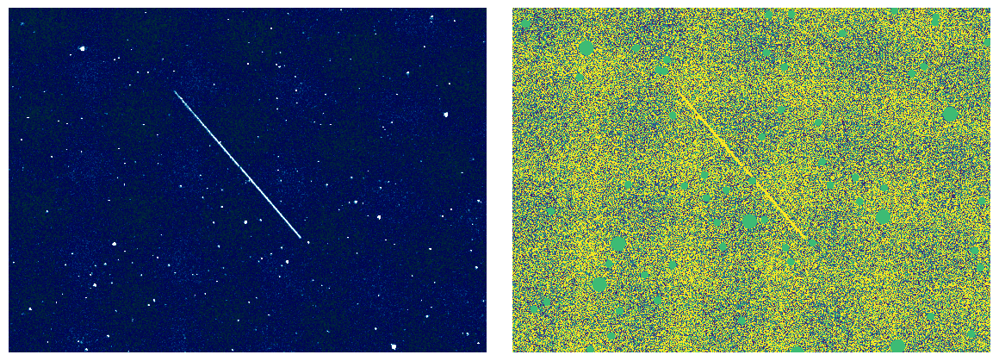

In [55]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=[12,8], sharey=True)

# ax1.imshow(np.fabs(diff), interpolation="none", vmin=0, vmax=1000., cmap='viridis')
# ax2.imshow(np.fabs(mask), interpolation="none", vmin=0, vmax=1000., cmap='viridis')
# ax.imshow(data, vmin=0, vmax=100, cmap='twilight')

# ax1.imshow(diff, vmin=-10, vmax=100., cmap='ocean')
# ax2.imshow(mask, vmin=-10, vmax=100., cmap='ocean')

ax1.imshow(np.fabs(diff), vmin=-20, vmax=100., cmap='ocean')
# ax2.imshow(np.fabs(mask), vmin=-20, vmax=100., cmap='ocean')
ax2.imshow(np.fabs(mask), interpolation="none", vmin=0., vmax=20.)

for ax in [ax1, ax2]:
    ax.set_xlim([x[1]-500, x[0]+400])
    ax.set_ylim([y[1]+400, y[0]-500])
    ax.axis('off')

plt.tight_layout()
# plt.savefig(f'{savedir}stars_masked.png', bbox_inches='tight', dpi=300)
plt.show()

In [278]:
mean, median, sigma = aps.sigma_clipped_stats(np.abs(diff))

nostarimage = mask.copy()
nostarimage[-30:,:] = 0
nostarimage[:30,:] = 0
nostarimage[:,-30:] = 0
nostarimage[:,:30] = 0

maskim = nostarimage.copy()*0
maskim2 = nostarimage.copy()*0
maskim2[np.abs(nostarimage) > mean+2.5*sigma] = 1
out = cv2.dilate(np.uint8(maskim2),np.ones((3,3),np.uint8))
maskim[(np.abs(nostarimage) > mean+1.0*sigma)] = 1
maskim3 = maskim*out

reducedimage = np.uint8(np.clip(scn.filters.convolve(maskim3,np.ones((3,3))),6,9)-6)

/var/folders/5f/x4x1ls6j1_bgn5_rscqsv6tw0000gn/T/ipykernel_41717/3514783646.py:16: DeprecationWarning: Please use `convolve` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  reducedimage = np.uint8(np.clip(scn.filters.convolve(maskim3,np.ones((3,3))),6,9)-6)


In [280]:
fig, ((ax1, ax2, ax3), (ax4, ax5, ax6)) = plt.subplots(2, 3, figsize=[18,16], sharey=True)

vmin = -15.
vmax = 100.
cmap = 'viridis'

ax1.imshow(diff, vmin=vmin, vmax=vmax, cmap=cmap)
ax2.imshow(np.fabs(diff), vmin=vmin, vmax=vmax, cmap=cmap)
ax3.imshow(np.fabs(mask), vmin=vmin, vmax=vmax, cmap=cmap)
ax4.imshow(maskim2,  cmap=cmap)
ax5.imshow(maskim, cmap=cmap)
ax6.imshow(maskim3, cmap=cmap)

for ax in fig.axes:
    ax.axis('off')

plt.tight_layout()
plt.show()

In [235]:
def noise_example(figtype='all'):

    vmin = -15.
    vmax = 100.
    cmap = 'viridis'

        
    if figtype=='all':
        fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=[12,16], sharey=True, sharex=True)
        ax1.imshow(np.fabs(diff), vmin=vmin, vmax=vmax, cmap=cmap)
        ax2.imshow(np.fabs(mask), vmin=vmin, vmax=vmax, cmap=cmap)
        ax3.imshow(maskim3, cmap=cmap)
        ax4.imshow(reducedimage, cmap=cmap)
        for ax in fig.axes:
            ax.axis('off')
        plt.tight_layout()
        plt.savefig(f'{savedir}noise_all.png', bbox_inches='tight', dpi=300)
        plt.close()
        
        
    if figtype=='sep':
        fig, ax = plt.subplots(1, 1, figsize=[10,6])
        
        ax.imshow(diff, vmin=vmin, vmax=vmax, cmap='terrain')
        ax.axis('off')
        plt.tight_layout()
        plt.savefig(f'{savedir}noise_diff.png', bbox_inches='tight', dpi=300)
        ax.clear()
        
        ax.imshow(np.fabs(diff), vmin=vmin, vmax=vmax, cmap=cmap)
        ax.axis('off')
        plt.tight_layout()
        plt.savefig(f'{savedir}noise_abs.png', bbox_inches='tight', dpi=300)
        ax.clear()

        ax.imshow(np.fabs(mask), vmin=vmin, vmax=vmax, cmap=cmap)
        ax.axis('off')
        plt.tight_layout()
        plt.savefig(f'{savedir}noise_mask.png', bbox_inches='tight', dpi=300)
        ax.clear()
        
        ax.imshow(maskim3, cmap=cmap)
        ax.axis('off')
        plt.tight_layout()
        plt.savefig(f'{savedir}noise_suppressed.png', bbox_inches='tight', dpi=300)
        ax.clear()
        
        ax.imshow(reducedimage, cmap=cmap)
        ax.axis('off')
        plt.tight_layout()
        plt.savefig(f'{savedir}noise_reduced.png', bbox_inches='tight', dpi=300)
        ax.clear()

        plt.close()
        
        
noise_example(figtype='sep')

In [284]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=[18,8], sharey=True)

vmin = -15.
vmax = 100.
cmap = 'viridis'

ax1.imshow(np.fabs(diff), vmin=vmin, vmax=vmax, cmap=cmap)
# ax2.imshow(np.fabs(mask), vmin=vmin, vmax=vmax, cmap=cmap)
ax2.imshow(np.fabs(mask), interpolation='none', vmin=0, vmax=1000, cmap='jet')
ax3.imshow(reducedimage)

for ax in fig.axes:
    ax.axis('off')

plt.tight_layout()
plt.show()

In [245]:
fig, ((ax1, ax2), (ax3, ax4), (ax5, ax6)) = plt.subplots(3, 2, figsize=[12,24], sharey=True, sharex=True)

vmin = -15.
vmax = 100.
cmap = 'viridis'

ax1.imshow(diff, vmin=vmin, vmax=vmax, cmap=cmap)
ax2.imshow(mask, vmin=vmin, vmax=vmax, cmap=cmap)

ax3.imshow(np.fabs(diff), vmin=vmin, vmax=vmax, cmap=cmap)
ax4.imshow(np.fabs(mask), vmin=vmin, vmax=vmax, cmap=cmap)

ax5.imshow(maskim3, cmap=cmap)
ax6.imshow(reducedimage, cmap=cmap)

for ax in fig.get_axes():
    ax.axis('off')

plt.tight_layout()
plt.show()

In [204]:
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=[12,16], sharey=True)

ax1.imshow(diff, vmin=-15, vmax=100., cmap='ocean')
ax2.imshow(mask, vmin=-15, vmax=100., cmap='ocean')

ax3.imshow(np.fabs(diff), interpolation="none", vmin=0, vmax=1000.)
ax4.imshow(np.fabs(mask), interpolation="none", vmin=0, vmax=1000.)

for ax in fig.get_axes():
    ax.axis('off')

plt.tight_layout()
plt.show()

In [265]:
def set_values_above_std(image):
    mean = np.mean(image)
    std = np.std(image)
    threshold = mean + std

    result = np.where(image > threshold, 1, 0)
    return result

test = set_values_above_std(np.fabs(mask))

fig, ax = plt.subplots(1, 1, figsize=[10,6])
ax.imshow(test)
ax.axis('off')
plt.tight_layout()
# plt.savefig(f'{savedir}noise_test.png', bbox_inches='tight', dpi=300)
plt.show()

In [201]:
fig, ax = plt.subplots(1, 1, figsize=[10,6])
ax.imshow(mask, vmin=0, vmax=100., cmap='terrain')
ax.axis('off')
plt.tight_layout()
# plt.savefig(f'{savedir}stars_masked.png', bbox_inches='tight', dpi=300)
plt.show()

# Results

In [2]:
def get_data(category):
    
    if category=='passages':
        files = sorted(glob.glob(f'{datadir}passages_*.p'))
        
    if category=='passed':
        files = sorted(glob.glob(f'{datadir}passed_*.p'))
    
    if category=='vmags':
        files = sorted(glob.glob(f'{datadir}vmags_july/vmags_*.p'))
        
    if category=='pools':
        files = sorted(glob.glob(f'{datadir}pool_*.p'))
        
    return files


# =================================================================================


def reduce_passages(camid):
    
    all_passages = pd.read_pickle(f'{datadir}passages_20221023{camid}.p')
    pool = pd.read_pickle(f'{datadir}pool_{camid}.p')

    passages = {}
    for lstseq, data in all_passages.items():
        if lstseq in pool:
            passages[lstseq] = {}
            for satnum in pool[lstseq]:
                if satnum in data:
                    passages[lstseq][satnum] = data[satnum]
                    
    return passages


# =================================================================================


def get_starlink_tles():
    
    # Load TLEs for all satellite passages
    satfiles = f"{testdir}3leComplete.txt"
    with open(satfiles) as f:
        all_tles = f.readlines()
        f.close()

    # Split TLE list into individual lists for each TLE
    all_tles = [i.strip() for i in all_tles]
    tles = [all_tles[x:x+3] for x in range(0, len(all_tles), 3)]

    # Reduce TLEs to Starlink only
    starlink_tles = []
    for tle in tles:
        if "STARLINK" in tle[0]:
            starlink_tles.append(tle)
            
    for tle in starlink_tles:
        tle[0] = tle[0][2:]
        
    return starlink_tles


# =================================================================================


def get_starlink_launches():
    """
    For the scraping: probably not the best way, but essentially just adds everything to a list.
    Thinking have it this way such that it just needs to be run once.
    
    """
    
    import requests
    from bs4 import BeautifulSoup
    
    base_url = 'https://nssdc.gsfc.nasa.gov/nmc/spacecraft/query'
    search_params = {'name': 'starlink'}

    # Send a GET request to the website
    response = requests.get(base_url, params=search_params)

    # Parse the HTML content of the page
    soup = BeautifulSoup(response.text, 'html.parser')

    
    # Index 0: Name         ...  Starlink 1007
    # Index 1: NSSDCA ID    ...  2019-074A
    # Index 2: Launch date  ...  2019-11-11 (Y:M:D)
    
    i=0
    names = []
    dates = []

    # Find the table rows that contain satellite data
    for row in soup.find_all('td'):
        entry = row.get_text()
        i+=1
        if i==1:
            entry = entry.upper().replace(' ', '-') #since my data is uppercase and hyphenated
            names.append(entry)
        if i==2:
            continue
        if i==3:
            dates.append(entry)
            i=0
            
    df = pd.DataFrame({'name': names, 'launch': dates})
    df['launch'] = pd.to_datetime(df['launch'])
    

    starlink_tles = get_starlink_tles()
        
        
    # DarkSat = Starlink-1130 = 44932U
    # Visors - 7 August 2020
    # Visors removed - 14 September 2021 onwards
    # V1.5 - 30 June 2021 onwards
    # V2-mini: 27 February 2023, 19 April 2023, 19 May 2023 ---> out of our date range
    
    
    df2 = pd.DataFrame(columns=['starlink', 'satnum', 'launch', 'version', 'type'])
    for i, tle in enumerate(starlink_tles):
        starlink = tle[0]
        try:
            idx = np.where(df.name.values == starlink)[0][0]
        except:
            continue
        satnum = tle[1].split()[1]
        date = df.launch.iloc[idx]
        satname = df.name.iloc[idx]

        # v0.1
        if date < pd.to_datetime('2018-02-23'):
            version = '0.1'
            sattype = 'tintin'

        # v0.9
        if date > pd.to_datetime('2018-02-23') and date < pd.to_datetime('2019-11-12'):
            version = '0.9'
            sattype = 'standard'

        # v1.0
        if date > pd.to_datetime('2019-11-12') and date < pd.to_datetime('2021-05-27'):
            version = '1.0'
            if satnum == '44932U':
                sattype = 'darksat'
            elif date > pd.to_datetime('2020-06-30'):
                sattype = 'visorsat'
            else:
                sattype = 'standard'

        # v1.5
        if date > pd.to_datetime('2021-05-27'):
            version = '1.5'
            if date < pd.to_datetime('2021-09-13'):
                sattype = 'visorsat'
            else:
                sattype = 'standard'


        row_data = [satname, satnum, date, version, sattype]
        df2.loc[len(df2)] = row_data
    
    return df2


# =================================================================================


def observation_info():
    
    df = get_starlink_launches()
    passages = get_data(category='passages')
    
    ### Timerange of observations
    for psg in passages:
        p = pd.read_pickle(psg)
        camid = psg[-5:-2]

        # JD of first observation
        lstseq0 = list(p)[0]
        sat0 = list(p[lstseq0])[0]
        jd0 = p[lstseq0][sat0]['start']['jd']

        # JD of last observation
        lstseq1 = list(p)[-1]
        sat1 = list(p[lstseq1])[0]
        jd1 = p[lstseq1][sat1]['end']['jd']

        t0 = Time(jd0, format='jd', scale='utc')
        t1 = Time(jd1, format='jd', scale='utc')
        time_diff = t1 - t0
        print(f"{camid} - time range spanned: {time_diff.to('hour')} ... {t0.iso} to {t1.iso}")
    
    
    ### Unique Starlinks
    
    vmags = get_data(category='vmags')
    all_sats = []
    for vmag in vmags:
        
        camid = vmag[-5:-2]
        v = pd.read_pickle(vmag)
        sats = []
        for lstseq in v:
            sats.extend(list(v[lstseq])[2:])
            
        all_sats.extend(sats)
        unique_sats = list(set(sats)) 
        print(f'{camid}: {len(sats)} observations;  {len(unique_sats)} unique starlinks')
        
    all_unique_sats = list(set(all_sats))
    print(f'\n{len(all_sats)} total observations  -  {len(all_unique_sats)} unique Starlinks\n')
    
    
    ### Type of Starlinks
    
    version = []
    sat_types = []
    for satnum in all_sats:
        sat_types.append(df.loc[df['satnum'] == satnum].type.values[0])
        version.append(df.loc[df['satnum'] == satnum].version.values[0])
    

    version_unique = []    
    sat_types_unique = []
    for satnum in all_unique_sats:
        sat_types_unique.append(df.loc[df['satnum'] == satnum].type.values[0])
        version_unique.append(df.loc[df['satnum'] == satnum].version.values[0])
        
    print(f"Standard:   {sat_types.count('standard')}  -   {sat_types_unique.count('standard')}")
    print(f"VisorSat:   {sat_types.count('visorsat')}   -   {sat_types_unique.count('visorsat')}")
    print(f"DarkSats:   {sat_types.count('darksat')}     -   {sat_types_unique.count('darksat')}\n")
    
    # Total
    count = {}
    x = list(zip(sat_types, version))
    print('For all observations:\n')
    for elem in x:
        key = elem[0] 
        val = elem[1]   
        if key in count:
            inner = count[key]
        else:
            inner= {}
            count[key] = inner  
        if val in inner:
            inner[val] += 1
        else:
            inner[val] = 1
            
    for key, inner in count.items():
        print(key + ":")
        for val, count in inner.items():
            print(f"  {val}: {count}")
            
    print('\n')
    
    # Unique
    count = {}
    x = list(zip(sat_types_unique, version_unique))
    print('For unique observations:\n')
    for elem in x:
        key = elem[0] 
        val = elem[1]   
        if key in count:
            inner = count[key]
        else:
            inner= {}
            count[key] = inner  
        if val in inner:
            inner[val] += 1
        else:
            inner[val] = 1
            
    for key, inner in count.items():
        print(key + ":")
        for val, count in inner.items():
            print(f"  {val}: {count}")
    

# =================================================================================
    

def get_siteinfo():
    confdir = '/Users/Peter/Projects/starlink_data/fotos-python3/bringfiles/siteinfo.dat'
    dtype = [('sitename', '|U20'), ('lat', 'float32'), ('lon', 'float32'), ('height', 'float32'), ('ID', '|U2')]
    siteinfo = np.genfromtxt(confdir, dtype=dtype)   
    mask = siteinfo['ID'] == 'LS'
    siteinfo = siteinfo[mask]
    return siteinfo


# =================================================================================


def create_dataframe():
    
    # ALL IMPORTANT INFO IN ONE DATAFRAME!!!
    
    d = {}
    vmag_files = get_data(category='vmags')
    satinfo = get_starlink_launches()
    
    for file in vmag_files:
        camid = file[-5:-2]
        vmags = pd.read_pickle(file)
        
        all_sats = []
        for lstseq in vmags:
            all_sats.extend(list(vmags[lstseq])[2:])
        sats = list(set(all_sats)) 

        # Creating a dictionary where each key is a unique satellite
        satdict = {}
        for satnum in sats:
            satdict[satnum] = {
                'satname':[], 'vmag':[], 'delta':[], 'flux':[], 'jd0':[], 'jd1':[], 
                'camid':[], 'type':[], 'version':[], 'annulus':[], 'launch':[]
            }
        
        for lstseq in vmags:
            satnums = list(vmags[lstseq])[2:]
            for satnum in satnums:
                if satnum in satdict.keys():
                    
                    jd0 = vmags[lstseq]['JD0']
                    jd1 = vmags[lstseq]['JD1']
                    vmag = vmags[lstseq][satnum]['vmag']
                    satname = vmags[lstseq][satnum]['name']
                    
                    flux = vmags[lstseq][satnum]['flux']
                    delta = vmags[lstseq][satnum]['delta']
                    area = vmags[lstseq][satnum]['annulus']
                    
                    launch = satinfo.loc[satinfo['satnum'] == satnum].launch.values[0]
                    sattype = satinfo.loc[satinfo['satnum'] == satnum].type.values[0]
                    version = satinfo.loc[satinfo['satnum'] == satnum].version.values[0]

                    satdict[satnum]['jd0'].append(jd0)
                    satdict[satnum]['jd1'].append(jd1)                                        
                    satdict[satnum]['vmag'].append(vmag)
                    satdict[satnum]['flux'].append(flux)
                    satdict[satnum]['delta'].append(delta)
                    satdict[satnum]['camid'].append(camid)
                    satdict[satnum]['type'].append(sattype)
                    satdict[satnum]['annulus'].append(area)
                    satdict[satnum]['launch'].append(launch)
                    satdict[satnum]['version'].append(version)
                    satdict[satnum]['satname'].append(satname)
                    
            
        d[camid] = pd.DataFrame([
            (satnum, satname, vmag, delta, flux, jd0, jd1, camid, sattype, version, area, launch) \
            for satnum, vals in satdict.items() \
            for satname, vmag, delta, flux, jd0, jd1, camid, sattype, version, area, launch in zip(
                vals['satname'], vals['vmag'], vals['delta'], vals['flux'], vals['jd0'], vals['jd1'], 
                vals['camid'], vals['type'], vals['version'], vals['annulus'], vals['launch']
            )], columns=['satnum', 'satname', 'vmag', 'delta', 'flux', 'JD0', 'JD1', 'camid', 
                         'type', 'version', 'annulus', 'launch']
        )
    
    df = pd.concat(d.values(), ignore_index=True)
    
    # ------
    
    starlink_tles = get_starlink_tles() 
    eph = load('de421.bsp')
    sun = eph['sun']
    earth = eph['earth']
    
    ts = load.timescale()
    site = get_siteinfo()
    mascara = wgs84.latlon(latitude_degrees=site[0][1], longitude_degrees=site[0][2], elevation_m=site[0][3])
    observer = mascara + earth
    
    sorted_df = df.sort_values('JD0')
    for index, row in sorted_df.iterrows():
        t = row['JD0']
        obs_time = ts.ut1_jd(t)
        
        # Sun position
        astro = observer.at(obs_time).observe(sun)
        app = astro.apparent()
        alt, az, dist = app.altaz()
        df.loc[index, 'sun_alt'] = alt.degrees
        df.loc[index, 'sun_az'] = az.degrees
        
        satname = row.satname
        for tle in starlink_tles:
            if satname in tle[0]:
                sat = EarthSatellite(tle[1], tle[2], tle[0], ts) 
                
                # Inclination
                inc = sat.model.inclo
                inc = Angle(radians=inc).degrees
                df.loc[index, 'inc'] = inc
                
                # Position - altaz
                diff = sat - mascara
                topocentric = diff.at(obs_time)
                alt, az, dist = topocentric.altaz()
                df.loc[index, 'alt'] = alt.degrees
                df.loc[index, 'az'] = az.degrees
                df.loc[index, 'range'] = dist.km
                
                # Position - radec
                ra, dec, _ = topocentric.radec() 
                df.loc[index, 'ra'] = ra.hours
                df.loc[index, 'dec'] = dec.degrees
                
                # Height
                geocentric = sat.at(obs_time)
                height = wgs84.height_of(geocentric)
                df.loc[index, 'height'] = height.km
                
                # Phase angle            
                sat_pov = earth + sat
                phase_angle = sat_pov.at(obs_time).observe(observer).phase_angle(sun)
                df.loc[index, 'phase_angle'] = phase_angle.degrees
                
                """
                phase_angle(): given an illuminator (usually the Sun) as their argument, compute 
                the angle Sun-target-observer. Returns the Angle from the body’s point of view between 
                light arriving from the Sun and the light departing toward the observer. This angle is 0° 
                if the observer is in the same direction as the Sun and sees the body as fully illuminated, 
                and 180° if the observer is behind the body and sees only its dark side
                """

                break   
            
                
    # Normalize the magnitudes to a fixed range of 550 km
    # THIS IS NOT A LINEAR ADJUSTMENT!
    # The factor for adjusting the apparent magnitudes from the actual range to a standard distance 
    # determined based on the inverse square law of light!
    
    # Note, this is also how the Zwicky paper does it! m_550 = m - 5*log10(r/550)
    
    #df['delta_norm'] = np.sqrt(df['delta']**2 + (2.5 * np.log10(factor) * np.log(10) * df['delta'])**2)
    
    
    df['vmag_norm_550'] = df['vmag'] - 5 * np.log10(df['range']/550.)
    df['vmag_norm_1000'] = df['vmag'] - 5 * np.log10(df['range']/1000.)

    
    df.replace([np.inf, -np.inf], np.nan, inplace=True)
    return df


# =================================================================================


In [3]:
df = create_dataframe()
df_starlink = get_starlink_launches()

# How many unique starlinks per camera?

In [39]:
x = []
for cam in ['LSN', 'LSS', 'LSW', 'LSE', 'LSC']:
    y = df[df.camid==cam].satnum.unique()
    print(cam, len(y))
    x.extend(y)

print('Total:', len(np.unique(x)))

LSN 20
LSS 65
LSW 63
LSE 67
LSC 36
Total: 175


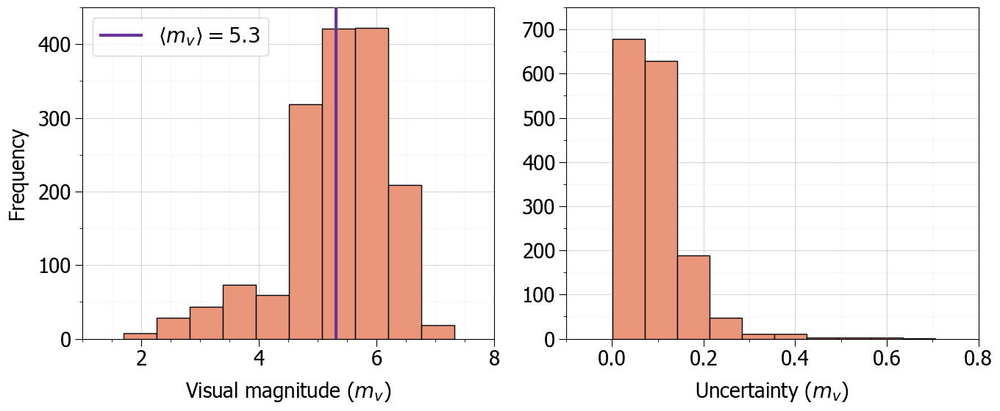

In [34]:
%matplotlib inline
def hist():
    fig, (ax1,ax2) = plt.subplots(1, 2, figsize=[14,6])
    
    ax1.hist(df.vmag, color='darksalmon', ec='k', zorder=2)
    ax2.hist(df.delta, color='darksalmon', ec='k', zorder=2)
    ax1.set_xlabel(r'Visual magnitude ($m_v$)', fontsize=20, labelpad=10)
    ax2.set_xlabel(r'Uncertainty ($m_v$)', fontsize=20, labelpad=10)
    ax1.set_ylabel('Frequency', fontsize=20, labelpad=10)
    
    #ax1.set_title(f'{len(df)} measurements')
    #ax2.set_title(f'{len(df)} measurements')
    
    ax1.set_ylim([0,450])
    ax2.set_ylim([0,750])
    ax1.set_xlim([1, 8])
    ax2.set_xlim([-0.1, 0.8])
    
    ax1.axvline(np.mean(df['vmag']), c='rebeccapurple', lw=3, ls='-', zorder=3,
          label=r'$\langle m_v \rangle = {}$'.format(round(np.mean(df['vmag']), 1)))
    
    ax1.legend(fontsize=20)
    
    
    for ax in [ax1, ax2]:
        ax.minorticks_on()
        ax.tick_params(axis='both', which='major', length=7, direction='out') 
        ax.tick_params(axis='both', which='minor', length=3, direction='out')   
        ax.grid(alpha=0.5, which='both', zorder=1)
        ax.grid(which='minor', alpha=0.1, zorder=1)
        ax.yaxis.set_minor_locator(plt.MultipleLocator(50))
        
    ax1.xaxis.set_minor_locator(plt.MultipleLocator(0.5))
    ax2.xaxis.set_minor_locator(plt.MultipleLocator(0.1))
    
    
    plt.tight_layout()
    plt.savefig(f'{savedir}magnitude_hist.png', dpi=300, bbox_inches='tight')
    plt.show()
    
hist()

5.312864968138467
0.09645498052699142


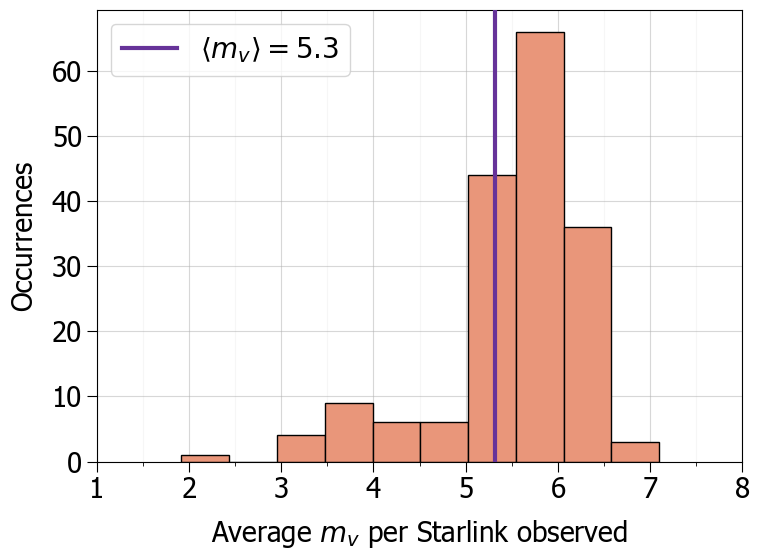

In [438]:
def hist():
    fig, ax = plt.subplots(1, 1, figsize=[8,6])
    
    avgs = []
    for sat in df.satnum.unique():
        avgs.append(np.mean(df[df.satnum==sat].vmag))
    
    ax.hist(avgs, color='darksalmon', ec='k', zorder=2)
    ax.set_xlabel(r'Average $m_v$ per Starlink observed', fontsize=20, labelpad=10)
    ax.set_ylabel('Occurrences', fontsize=20, labelpad=10)

    ax.axvline(np.mean(df['vmag']), c='rebeccapurple', lw=3, ls='-', zorder=3,
          label=r'$\langle m_v \rangle = {}$'.format(round(np.mean(df['vmag']), 1)))
    
    ax.minorticks_on()
    ax.set_xlim([1,8])
    ax.legend(fontsize=20)
    ax.grid(alpha=0.5, which='both', zorder=1)
    ax.grid(which='minor', alpha=0.1, zorder=1)
    ax.tick_params(axis='both', which='major', length=7, direction='out') 
    ax.tick_params(axis='both', which='minor', length=3, direction='out')   
    ax.yaxis.set_minor_locator(plt.MultipleLocator(50))
    ax.xaxis.set_minor_locator(plt.MultipleLocator(0.5))
    
    print(np.mean(df['vmag']))
    print(np.mean(df['delta']))
    
    
    plt.tight_layout()
    #plt.savefig(f'{savedir}avg_magnitude_hist.png', dpi=300, bbox_inches='tight')
    plt.show()
    
hist()

546.1797326297107 1280.8610070351392
784.4692993178719
457.1963629090987 583.4269607516198


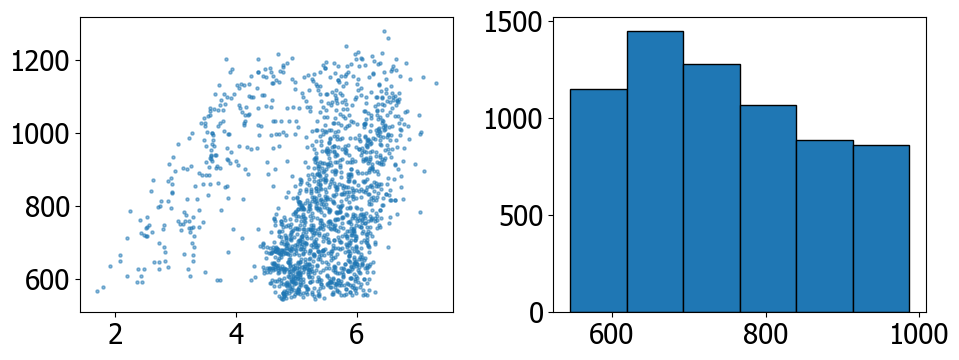

In [445]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=[10,4])
ax1.scatter(df['vmag'], df['range'], s=5, alpha=0.5)
print(min(df.range), max(df.range))
print(np.median(df.range))
print(min(df.height), max(df.height))
ax2.hist(df.range, weights=df.vmag, ec='k')
plt.tight_layout()
plt.show()

# Outliers - interesting !!!

In [131]:
print(df[df.vmag == min(df.vmag)][['satname', 'vmag', 'vmag_norm_1000', 'delta', 'launch']])
print(df[df.vmag == max(df.vmag)][['satname', 'vmag', 'vmag_norm_1000', 'delta', 'launch']])

           satname      vmag  vmag_norm_1000     delta     launch
126  STARLINK-2735  1.701046        2.933146  0.037194 2021-05-26
           satname      vmag  vmag_norm_1000    delta     launch
473  STARLINK-2234  7.318041         7.03946  0.03909 2021-05-15


In [22]:
min_vmag = 10
min_delta = 0
min_camid = 0
min_lstseq = 0
min_satnum = 0

max_vmag = 0
max_delta = 0
max_camid = 0
max_lstseq = 0
max_satnum = 0

files = glob.glob(f'{datadir}vmags_july/*.p')

for f in files:
    camid = f[-5:-2]   
    v = pd.read_pickle(f)
    for lstseq in v.keys():
        if len(list(v[lstseq])[2:]) > 0:
            for satnum in list(v[lstseq])[2:]:
                vmag = v[lstseq][satnum]['vmag']
                if vmag < min_vmag:
                    min_vmag = vmag
                    min_delta = v[lstseq][satnum]['delta']
                    min_camid = camid
                    min_lstseq = lstseq
                    min_satnum = satnum
                if vmag > max_vmag:
                    if (v[lstseq][satnum]['FOTOS']['length'] / v[lstseq][satnum]['TLE']['length']) > 0.9:
                        max_vmag = vmag
                        max_delta = v[lstseq][satnum]['delta']
                        max_camid = camid
                        max_lstseq = lstseq
                        max_satnum = satnum

print('Min:', min_camid, min_lstseq, min_satnum, min_vmag, min_delta)
print('Max:', max_camid, max_lstseq, max_satnum, max_vmag, max_delta)

Min: LSC 48510819 48667U 1.7010460237719016 0.0371944908290809
Max: LSN 48510847 48010U 6.144154514330463 0.04199289793358262


In [144]:
test = df[df['satnum']=='48667U'].vmag_norm_1000.values
np.std(test)

0.6050687390293693

In [138]:
print(min(test), max(test))
print(len(test))

2.9331459821079697 5.018176726143136
25


In [146]:
df[(df['satnum']=='48667U') & (df['camid']=='LSC')][['vmag_norm_1000', 'delta']]

,vmag_norm_1000,delta
126,2.933146,0.037194
127,2.991004,0.035396
128,3.496579,0.054077
129,3.512273,0.044841


In [145]:
print(test[0:4])
print(np.std(test[0:4]))

[2.93314598 2.99100357 3.49657852 3.51227282]
0.2720024818348179


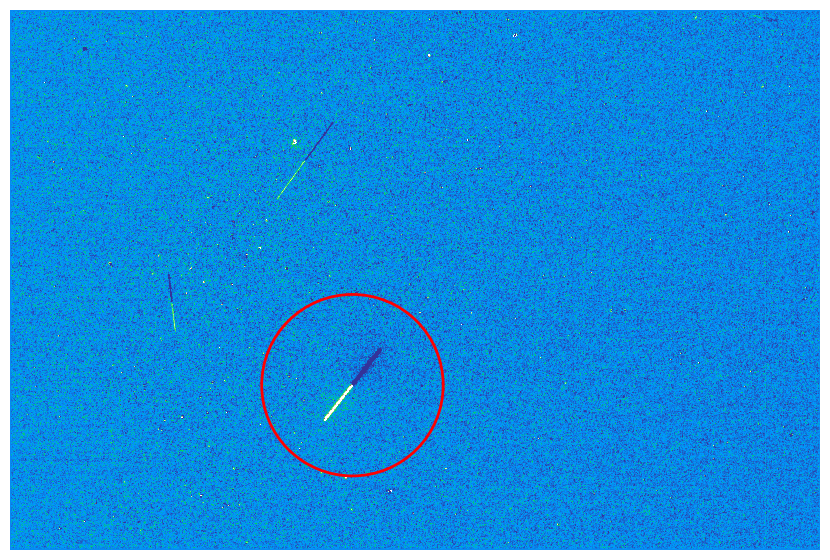

In [41]:
# from mpl_toolkits.axes_grid1.inset_locator import inset_axes

min_outlier = f'{testdir}outliers/diff_{min_lstseq}{min_camid}.fits.gz'
data, header = pf.getdata(min_outlier, header=True)
mean, median, sigma = aps.sigma_clipped_stats(np.abs(data))
data[data >= 0.9*65535] = median
lx = header['X0']
nx_image = header['XSIZE']
ux = lx + nx_image
ly = header['Y0']
ny_image = header['YSIZE']
uy = ly + ny_image

fig, ax = plt.subplots(1, 1, figsize=[10,6])
ax.imshow(data, vmin=-15, vmax=100, cmap='terrain')
ax.axis('off')

v = pd.read_pickle(f'{datadir}vmags_july/vmags_{min_camid}.p')
x = v[min_lstseq][min_satnum]['FOTOS']['x']
y = v[min_lstseq][min_satnum]['FOTOS']['y']
d = v[min_lstseq][min_satnum]['FOTOS']['length']
# ax1.scatter(x, y, c='red', s=5)

a,b = int(round((np.sum(x))/2.)), int(round((np.sum(y))/2.))
circle = plt.Circle((a, b), d, ec='r', fc='none', zorder=3, lw=2)
ax.add_patch(circle)

plt.tight_layout()
# plt.savefig(f'{savedir}min_outlier.png', dpi=300, bbox_inches='tight')
plt.show()

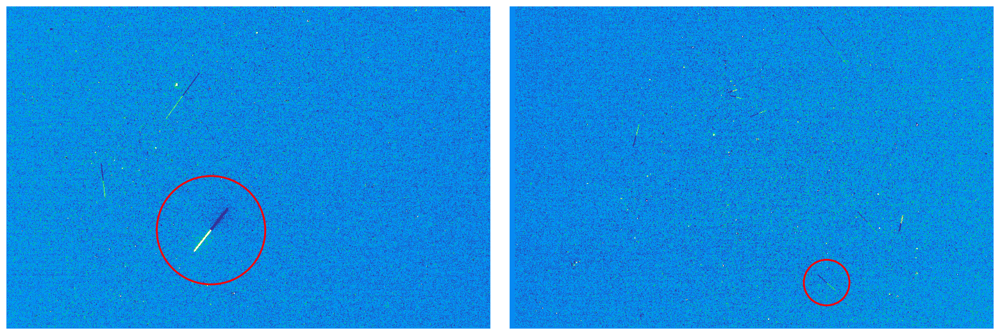

In [39]:
# from mpl_toolkits.axes_grid1.inset_locator import inset_axes

min_outlier = f'{testdir}outliers/diff_{min_lstseq}{min_camid}.fits.gz'
max_outlier = f'{testdir}outliers/diff_{max_lstseq}{max_camid}.fits.gz'

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=[16,8])

for (file, camid, lstseq, satnum, ax) in zip(
    [min_outlier, max_outlier], [min_camid, max_camid], [min_lstseq, max_lstseq], [min_satnum, max_satnum], [ax1, ax2]):

    data, header = pf.getdata(file, header=True)
    mean, median, sigma = aps.sigma_clipped_stats(np.abs(data))
    data[data >= 0.9*65535] = median
    lx = header['X0']
    nx_image = header['XSIZE']
    ux = lx + nx_image
    ly = header['Y0']
    ny_image = header['YSIZE']
    uy = ly + ny_image

    ax.imshow(data, vmin=-15, vmax=100, cmap='terrain')
    ax.axis('off')

    v = pd.read_pickle(f'{datadir}vmags_july/vmags_{camid}.p')
    x = v[lstseq][satnum]['FOTOS']['x']
    y = v[lstseq][satnum]['FOTOS']['y']
    d = v[lstseq][satnum]['FOTOS']['length']
    # ax1.scatter(x, y, c='red', s=5)

    a,b = int(round((np.sum(x))/2.)), int(round((np.sum(y))/2.))
    circle = plt.Circle((a, b), d, ec='r', fc='none', zorder=3, lw=2)
    ax.add_patch(circle)

plt.tight_layout()
plt.savefig(f'{savedir}outliers.png', dpi=300, bbox_inches='tight')
plt.show()

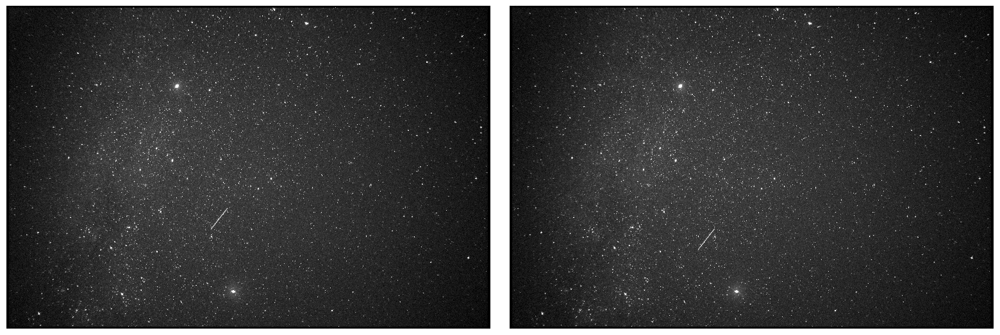

In [42]:
min_img1 = f'{testdir}outliers/48510819LSC.fits.gz'
min_img2 = f'{testdir}outliers/48510820LSC.fits.gz'

data1 = pf.getdata(min_img1)
data2 = pf.getdata(min_img2)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=[16,8])

from matplotlib import colors
cmap='binary_r'

ax1.imshow(data1, interpolation="none", cmap=cmap, norm=colors.LogNorm(vmin=1000, vmax=2000))
# ax1.imshow(data2, interpolation="none", vmin=1000, vmax=2000., alpha=0.5)
ax2.imshow(data2, interpolation="none", cmap=cmap, norm=colors.LogNorm(vmin=1000, vmax=2000))
# ax1.imshow(data1, interpolation="none", vmin=1000, vmax=2000., cmap=cmap)
# ax2.imshow(data2, interpolation="none", vmin=1000, vmax=2000., cmap=cmap)
ax1.axis('off')
ax2.axis('off')

plt.tight_layout()
# plt.savefig(f'{savedir}outliers_raw_log.png', dpi=300, bbox_inches='tight')
plt.show()

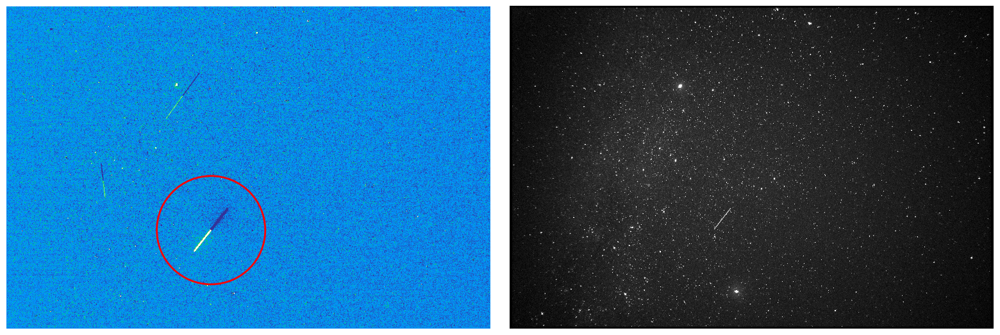

In [127]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=[16,8])

min_outlier = f'{testdir}outliers/diff_{min_lstseq}{min_camid}.fits.gz'
data, header = pf.getdata(min_outlier, header=True)
mean, median, sigma = aps.sigma_clipped_stats(np.abs(data))
data[data >= 0.9*65535] = median
lx = header['X0']
nx_image = header['XSIZE']
ux = lx + nx_image
ly = header['Y0']
ny_image = header['YSIZE']
uy = ly + ny_image
ax1.imshow(data, vmin=-15, vmax=100, cmap='terrain')
ax1.axis('off')
v = pd.read_pickle(f'{datadir}vmags_july/vmags_{min_camid}.p')
x = v[min_lstseq][min_satnum]['FOTOS']['x']
y = v[min_lstseq][min_satnum]['FOTOS']['y']
d = v[min_lstseq][min_satnum]['FOTOS']['length']
a,b = int(round((np.sum(x))/2.)), int(round((np.sum(y))/2.))
circle = plt.Circle((a, b), d, ec='red', fc='none', zorder=3, lw=2, ls='-')
ax1.add_patch(circle)

min_img = f'{testdir}outliers/48510819LSC.fits.gz'
data = pf.getdata(min_img)
ax2.imshow(data1, interpolation="none", vmin=1000, vmax=2000, cmap='binary_r')
ax2.axis('off')

plt.tight_layout()
plt.savefig(f'{savedir}min_outlier_both.png', dpi=300, bbox_inches='tight')
plt.show()

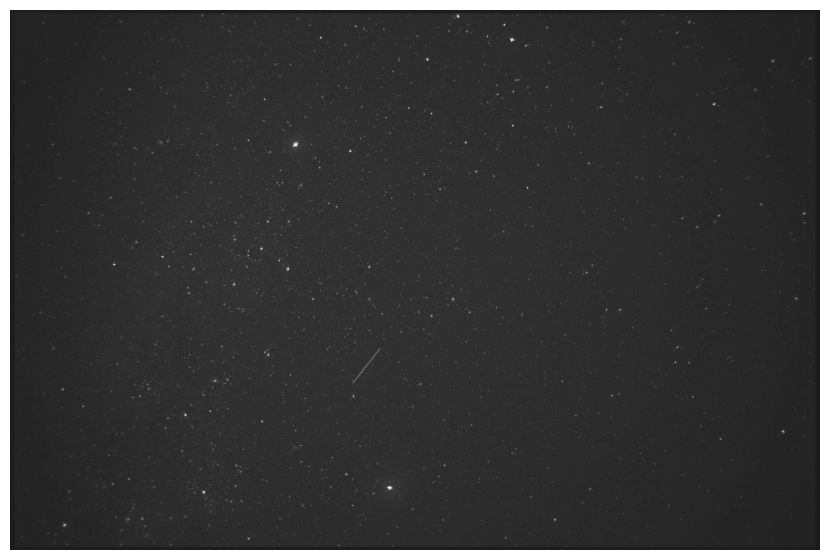

In [110]:
def image_test(data):

    # norm = data / np.max(data)
    
    norm = (data - np.min(data)) / (np.max(data) - np.min(data))

    sqrt_image = np.sqrt(norm)

    
    # Threshold the transformed images (you can adjust the threshold value as needed)
    threshold = 0.35#0.185
    sqrt_thresholded = np.clip(sqrt_image, 0, threshold)
    
    fig, ax = plt.subplots(figsize=(10, 6))

    # ax.imshow(data, interpolation="none", vmin=1000, vmax=2000, cmap='binary_r')
    ax.imshow(sqrt_thresholded, cmap='binary_r')
    ax.axis('off')

    # plt.subplot(122)
    # plt.imshow(log_thresholded, cmap='binary_r')
    # plt.title("Logarithmic Transformed (with Threshold)", fontsize=10)
    # plt.axis('off')
    
    plt.tight_layout()
    plt.savefig(f'{savedir}outlier_raw_sqrt2.png', dpi=300, bbox_inches='tight')
    plt.show()


data = pf.getdata(min_img1)
image_test(data)

In [150]:
v = pd.read_pickle(f'{datadir}vmags_july/vmags_{min_camid}.p')
lstseqs = []
test = np.arange(int(min_lstseq)-10, int(min_lstseq)+10)
for curlstseq in test:
    lstseq = str(curlstseq)
    if lstseq in v:
        if min_satnum in v[lstseq]:
            lstseqs.append(lstseq)

l = []
for lstseq in lstseqs:
    vmag = v[lstseq][min_satnum]['vmag']
    l.append(v[lstseq][min_satnum]['FOTOS']['length'] / v[lstseq][min_satnum]['TLE']['length'])
    print(lstseq, vmag)

48510819 1.7010460237719016
48510820 1.7993436634665478
48510821 2.3563151769383666
48510822 2.432808458392355


In [152]:
print(l)
print(np.std(l))

[1.0022321428571428, 1.006741573033708, 0.7110609480812641, 0.8253968253968254]
0.12486426916813831


In [216]:
%matplotlib qt

fig, axs = plt.subplots(2, 2, figsize=[16,16])

for ax, lstseq in zip(axs.ravel(), lstseqs):
    
    data = pf.getdata(f'{testdir}outliers/diff_{lstseq}LSC.fits.gz')
    ax.imshow(data, vmin=-15, vmax=100, cmap='terrain')
    ax.axis('off')

plt.tight_layout()
plt.show()

In [350]:
%matplotlib qt

fig, ax = plt.subplots(1, 1, figsize=[10,6])

for a, lstseq in zip([1, 0.8, 0.6, 0.4], lstseqs):
    
    data = pf.getdata(f'{testdir}outliers/diff_{lstseq}LSC.fits.gz')
    ax.imshow(data, vmin=-15, vmax=100, cmap='terrain', alpha=a)

ax.axis('off')
plt.tight_layout()
plt.show()

In [399]:
latex_df = df[['satname', 'JD0', 'vmag', 'height', 'range', 'inc', 'alt', 'az', 'sun_alt', 'sun_az']]
latex_df = latex_df[~latex_df['satname'].duplicated(keep=False)]

print(latex_df.to_latex(index=False,
                  formatters={"name": str.upper},
                  float_format="{:.2f}".format,
))

\begin{tabular}{lrrrrrrrrr}
\toprule
satname & JD0 & vmag & height & range & inc & alt & az & sun_alt & sun_az \\
\midrule
STARLINK-2598 & 2459876.53 & 6.05 & 556.32 & 579.34 & 53.05 & 72.23 & 263.99 & -21.79 & 241.72 \\
STARLINK-1541 & 2459876.83 & 4.79 & 555.84 & 1168.13 & 53.06 & 23.76 & 73.17 & -24.92 & 121.22 \\
STARLINK-3930 & 2459876.83 & 4.78 & 548.47 & 1187.34 & 53.22 & 22.74 & 62.66 & -23.88 & 120.27 \\
STARLINK-3753 & 2459876.83 & 5.14 & 552.75 & 1153.68 & 53.22 & 24.02 & 152.49 & -25.52 & 121.78 \\
STARLINK-3810 & 2459876.86 & 1.92 & 550.89 & 636.71 & 53.22 & 58.06 & 206.92 & -18.03 & 115.38 \\
STARLINK-1466 & 2459876.54 & 6.43 & 559.63 & 1063.97 & 53.06 & 27.58 & 172.38 & -23.87 & 239.89 \\
STARLINK-3068 & 2459876.55 & 6.61 & 582.11 & 873.48 & 70.00 & 38.70 & 188.27 & -26.37 & 237.54 \\
STARLINK-3048 & 2459876.55 & 6.14 & 582.76 & 869.10 & 70.00 & 39.05 & 206.67 & -27.59 & 236.31 \\
STARLINK-1559 & 2459876.84 & 4.13 & 560.40 & 1131.48 & 53.05 & 25.20 & 187.63 & -21.60 & 11

standard 0.003238007924487211
0.09499361660292491
visorsat 0.006355401724156662
0.10157835870814394
darksat 0.06309362755138943
0.08873410341527935
Overall: 0.0028852231078077316
0.1


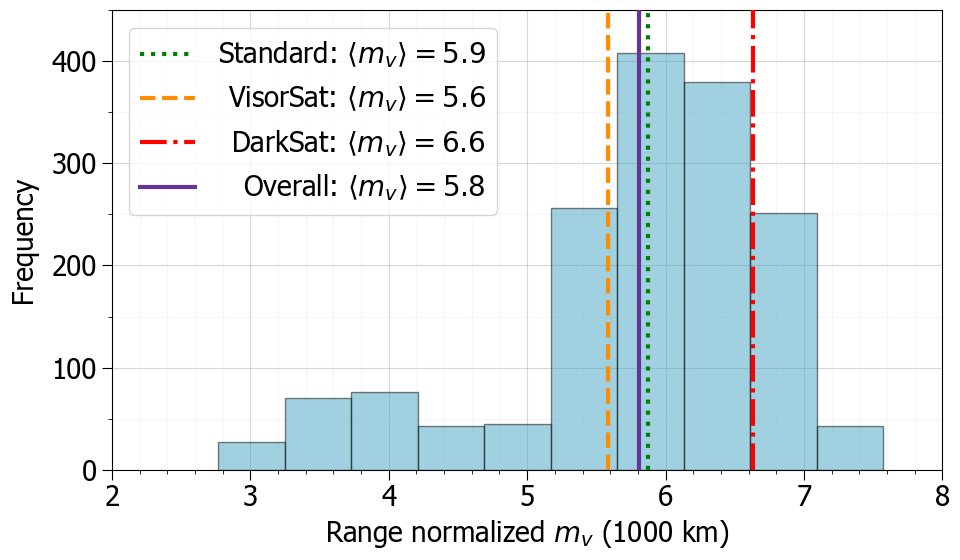

In [35]:
%matplotlib inline
def hist_averages_norm(normtype='1000', savefig=False):

    fig, ax = plt.subplots(1, 1, figsize=[10,6])

    column = f'vmag_norm_{normtype}'

    standard = df[df.type=='standard'][[column]]
    visors  = df[df.type=='visorsat'][[column]]
    darksat = df[df.type=='darksat'][[column]]

    n_bins = 10
    ax.hist(df[column], n_bins, fc='#44a5c2', alpha=0.5, zorder=2, ec='k')
    ax.grid(alpha=0.5, which='both', zorder=1)
    ax.grid(which='minor', alpha=0.1, zorder=1)

    ax.axvline(np.mean(standard[column]), c='green', lw=3, zorder=3, ls=':',
              label=r'Standard: $\langle m_v \rangle = {}$'.format(round(np.mean(standard[column]), 1)))

    ax.axvline(np.mean(visors[column]), c='darkorange', lw=3, zorder=3, ls='--',
              label=r'VisorSat: $\langle m_v \rangle = {}$'.format(round(np.mean(visors[column]), 1))) 

    ax.axvline(np.mean(darksat[column]), c='red', lw=3, zorder=3, ls='-.',
              label=r'DarkSat: $\langle m_v \rangle = {}$'.format(round(np.mean(darksat[column]), 1)))

    ax.axvline(np.mean(df[column]), c='rebeccapurple', lw=3, zorder=3, ls='-',
              label=r'Overall: $\langle m_v \rangle = {}$'.format(round(np.mean(df[column]), 1))) 
    
    
    ax.legend(fontsize=20, frameon=True, bbox_to_anchor=(0.415,0.985))

    ax.minorticks_on()
    ax.tick_params(axis='both', which='major', length=7, direction='out') 
    ax.tick_params(axis='both', which='minor', length=3, direction='out')   
    ax.set_ylabel('Frequency', labelpad=10, fontsize=20)
    ax.set_xlabel(f'Range normalized $m_v$ ({normtype} km)', fontsize=20)
    
    ax.xaxis.set_minor_locator(plt.MultipleLocator(0.2))
    ax.yaxis.set_minor_locator(plt.MultipleLocator(50))
    ax.set_ylim([0,450])
    ax.set_xlim([2,8])

    leg = ax.legend(fontsize=20, frameon=True, bbox_to_anchor=(0.48,0.99))
    max_shift = max([t.get_window_extent().width for t in leg.get_texts()])
    for t in leg.get_texts():
        t.set_ha('left')
        temp_shift = max_shift - t.get_window_extent().width
        t.set_position((temp_shift, 0))
        
        
    # Uncertainty - assuming distance uncertainty is negligible, delta = delta_norm_1000
    # Need delta for the average value:
    # 𝛿m_avg = [sqrt(𝛿𝑥^2 + 𝛿𝑦^2 + ... + 𝛿k^2)] / N
    
    for col in ['standard', 'visorsat', 'darksat']:
        data = df[df.type==col]['delta']
        delta_norm_avg = (np.sqrt(np.sum(data**2))) / len(data)
        print(col, delta_norm_avg)
        print(np.mean(data))
        
    data = df['delta']
    delta_norm_avg = (np.sqrt(np.sum(data**2))) / len(data)
    print('Overall:', delta_norm_avg)
    print(round(np.mean(data),2))
    

    plt.tight_layout()
    if savefig:
        plt.savefig(f'{savedir}hist_types_norm_{normtype}.png', dpi=300, bbox_inches='tight')
    plt.show()

hist_averages_norm(normtype='1000', savefig=False)

In [437]:
# This is super dodge of me ..
df[(df.vmag < 5.313) & (df.vmag > 5.311)].delta

475    0.092653
Name: delta, dtype: float64

5.807818259461353
0.9 0.010168110092589933
0.10220887450237864
1.0 0.004168645462190285
0.09908801789452588
1.5 0.004329716899620352
0.09219968738935445
Overall: 0.0028852231078077316
124 814 667


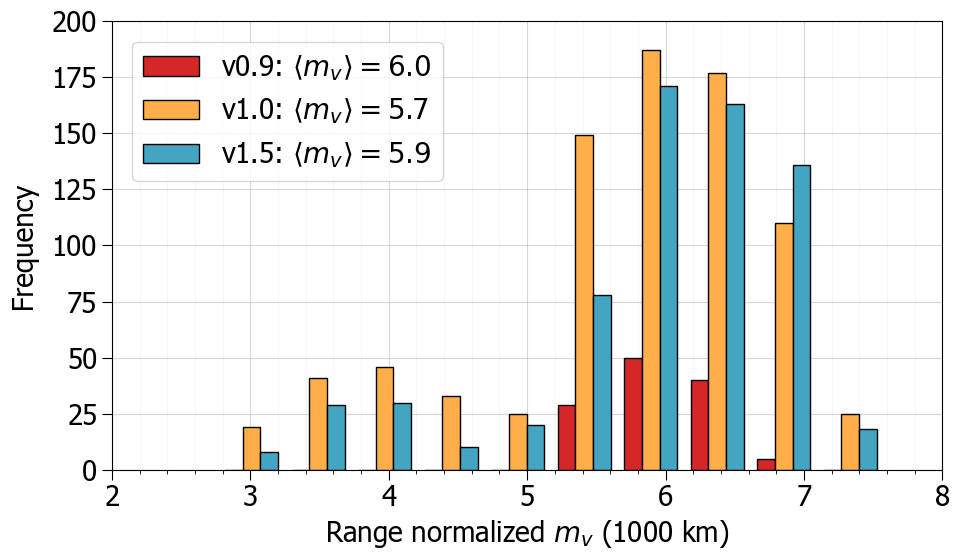

In [36]:
def hist_stacked_versions(normtype='1000', savefig=False):
    
    fig, ax = plt.subplots(1, 1, figsize=[10,6])
    column = f'vmag_norm_{normtype}'
     
    #stan = df[df.type=='standard']     
    stan = df.copy()
    v09 = stan[stan.version=='0.9'][column]
    v10 = stan[stan.version=='1.0'][column]
    v15 = stan[stan.version=='1.5'][column]
    
#     cols = ['#44a5c2', '#ffae49', 'C3']
#     labs = [r'v1.5: $\langle m_v \rangle = {}$'.format(round(np.mean(v15),1)),
#             r'v1.0: $\langle m_v \rangle = {}$'.format(round(np.mean(v10),1)),
#             r'v0.9: $\langle m_v \rangle = {}$'.format(round(np.mean(v09),1))]
    
    cols = ['C3', '#ffae49', '#44a5c2']
    labs = [r'v0.9: $\langle m_v \rangle = {}$'.format(round(np.mean(v09),1)),
            r'v1.0: $\langle m_v \rangle = {}$'.format(round(np.mean(v10),1)),
            r'v1.5: $\langle m_v \rangle = {}$'.format(round(np.mean(v15),1))]
    
    ax.hist([v09,v10,v15], color=cols, label=labs, ec='k', zorder=2)
    ax.grid(alpha=0.5, which='both', zorder=1)
    ax.grid(which='minor', alpha=0.1, zorder=1)
    #ax.axvline(np.mean(stan[column]), c='hotpink', lw=3, zorder=3)    
    ax.legend(fontsize=20, frameon=True, bbox_to_anchor=(0.415,0.985))
    
#     ax.minorticks_on()
    ax.tick_params(axis='both', which='major', length=7, direction='out') 
    ax.tick_params(axis='x', which='minor', length=3, direction='out')   
    ax.set_ylabel('Frequency', labelpad=10, fontsize=20)
    ax.set_xlabel(f'Range normalized $m_v$ ({normtype} km)', fontsize=20)
    
    ax.xaxis.set_minor_locator(plt.MultipleLocator(0.2))
    ax.set_ylim([0,200])
    ax.set_xlim([2,8])
    
    print(np.mean(stan[column]))
    
    
    # Uncertainty - assuming distance uncertainty is negligible, delta = delta_norm_1000
    # Need delta for the average value:
    
    for col in ['0.9', '1.0', '1.5']:
        data = stan[stan.version==col]['delta']
        delta_norm_avg = (np.sqrt(np.sum(data**2))) / len(data)
        print(col, delta_norm_avg)
        print(np.mean(data))
        
    data = stan['delta']
    delta_norm_avg = (np.sqrt(np.sum(data**2))) / len(data)
    print('Overall:', delta_norm_avg)   
    
    print(len(v09), len(v10), len(v15))
    

    plt.tight_layout()
    if savefig:
        plt.savefig(f'{savedir}hist_versions_{normtype}.png', dpi=300, bbox_inches='tight')
    plt.show()
    
hist_stacked_versions(normtype='1000', savefig=True)

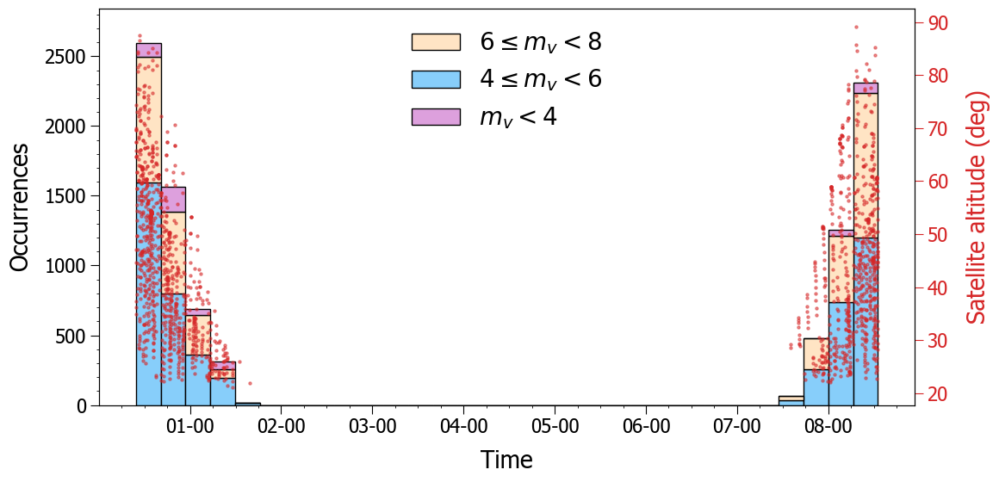

In [92]:
def time_seq_alt(alt='Satellite', savefig=False):

    fig, ax = plt.subplots(1, 1, figsize=[12,6])

    subset = df[['JD0', 'vmag_norm_1000', 'alt', 'sun_alt']].sort_values('JD0')
    jds = subset['JD0']
    vmags = subset['vmag_norm_1000']
    
    times = Time(jds, format='jd') 
    ax.hist(times.datetime, bins=30, weights=vmags, fc='None')
    ax.xaxis.set_major_locator(mdates.AutoDateLocator())
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%H-%M'))

    t4, t6, t8 = [], [], []
    v4, v6, v8 = [], [], []
    for i, vm in enumerate(vmags):
        if vm < 4:
            t4.append(jds[i])
            v4.append(vm)
        if vm >= 4 and vm < 6:
            t6.append(jds[i])
            v6.append(vm)
        if vm >= 6 and vm < 8:
            t8.append(jds[i])
            v8.append(vm)

    t8 = Time(t8, format='jd').datetime
    t6 = Time(t6, format='jd').datetime
    t4 = Time(t4, format='jd').datetime

    #cols = ['#44a5c2', '#ffae49', 'C3']
    cols = ['lightskyblue', 'bisque', 'plum']
    labs = [r'$4 \leq m_v < 6$', r'$6 \leq m_v < 8$', r'$m_v < 4$']
    ax.hist([t8,t6,t4], bins=30, weights=[v8,v6,v4], color=cols, label=labs, ec='k', stacked=True)

    handles, labels = ax.get_legend_handles_labels()
    order = [1,0,2]
    ax.legend(
        [handles[idx] for idx in order], [labels[idx] for idx in order], 
        loc='upper center', fontsize=20, frameon=False) 

    ax.minorticks_on()
    ax.tick_params(axis='y', which='both', direction='out', right=False)
    ax.tick_params(axis='x', which='both', direction='out', top=False)
    ax.tick_params(axis='both', which='major', length=7, labelsize=16)
    ax.tick_params(axis='both', which='minor', length=2)
    ax.set_ylabel('Occurrences', labelpad=10, fontsize=20)
    ax.set_xlabel('Time', fontsize=20, labelpad=10)
    
    
    # Altitudes
    twin = ax.twinx()
    
    if alt=='Sun':
        twin.scatter(times.datetime, subset['sun_alt'], s=5, c='C3')
    else:
        twin.scatter(times.datetime, subset['alt'], s=5, c='C3', alpha=0.5)
        
    twin.tick_params(axis='y', which='major', length=7, labelsize=16)
    twin.set_ylabel(f'{alt} altitude (deg)', fontsize=20, labelpad=15)
    twin.yaxis.label.set_color('C3')
    twin.tick_params(axis='y', colors='C3')

    plt.tight_layout()
    if savefig:
        plt.savefig(f'{savedir}time_seq_{alt}alt.png', dpi=300, bbox_inches='tight')
    plt.show()
    

time_seq_alt(alt='Satellite', savefig=False)

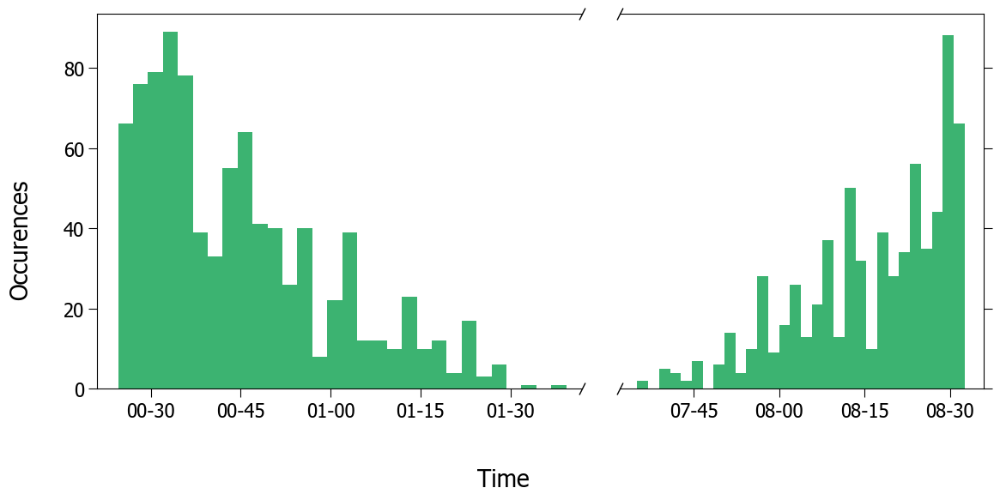

In [12]:
from datetime import datetime
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=[12,6], sharey=True, gridspec_kw={'width_ratios': [2, 1.5]})

subset = df[['JD0', 'vmag_norm_1000', 'alt', 'sun_alt']].sort_values('JD0')
jds = subset['JD0']
vmags = subset['vmag_norm_1000']

times = Time(jds, format='jd') 
set_min  = datetime(2022, 10, 24, 0, 15, 0)
set_max  = datetime(2022, 10, 24, 1, 55, 0)
rise_min = datetime(2022, 10, 24, 7, 0, 0)
rise_max = datetime(2022, 10, 24, 9, 0, 0)

sunset = [dt for dt in times.datetime if set_min  < dt < set_max]
sunrise = [dt for dt in times.datetime if rise_min < dt < rise_max]
vmags_set = vmags[0:len(sunset)]
vmags_rise = vmags[-len(sunrise):]

ax1.hist(sunset, bins=30, color='mediumseagreen')
ax2.hist(sunrise, bins=30, color='mediumseagreen')

ax1.yaxis.tick_left()
ax2.yaxis.tick_right()
ax2.tick_params(labelleft=False)
ax2.spines.left.set_visible(False)
ax1.spines.right.set_visible(False)
fig.supylabel('Occurences', fontsize=20)
fig.supxlabel('Time', fontsize=20)

for ax in fig.axes:
    ax.xaxis.set_major_locator(mdates.AutoDateLocator())
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%H-%M'))
    ax.tick_params(axis='both', which='major', length=7, labelsize=16)


d = 1
break_marker = [(-0.5, -d), (0.5, d)]
kwargs = dict(marker=break_marker, markersize=10, ls="none", c='k', mec='k', mew=1, clip_on=False)
ax1.plot([1, 1], [1, 0], transform=ax1.transAxes, **kwargs)
ax2.plot([0, 0], [1, 0], transform=ax2.transAxes, **kwargs)

ax1.set_xlim([datetime(2022, 10, 24, 0, 21, 0), datetime(2022, 10, 24, 1, 42, 0)])
ax2.set_xlim([datetime(2022, 10, 24, 7, 32, 0), datetime(2022, 10, 24, 8, 36, 0)])

ax1_ticks = [datetime(2022, 10, 24, 0, 30, 0),
             datetime(2022, 10, 24, 0, 45, 0),
             datetime(2022, 10, 24, 1, 0, 0),
             datetime(2022, 10, 24, 1, 15, 0),
             datetime(2022, 10, 24, 1, 30, 0)]
ax1.set_xticks(ax1_ticks)

ax2_ticks = [datetime(2022, 10, 24, 7, 45, 0),
             datetime(2022, 10, 24, 8, 0, 0),
             datetime(2022, 10, 24, 8, 15, 0),
             datetime(2022, 10, 24, 8, 30, 0)]
ax2.set_xticks(ax2_ticks)

plt.tight_layout()
plt.show()

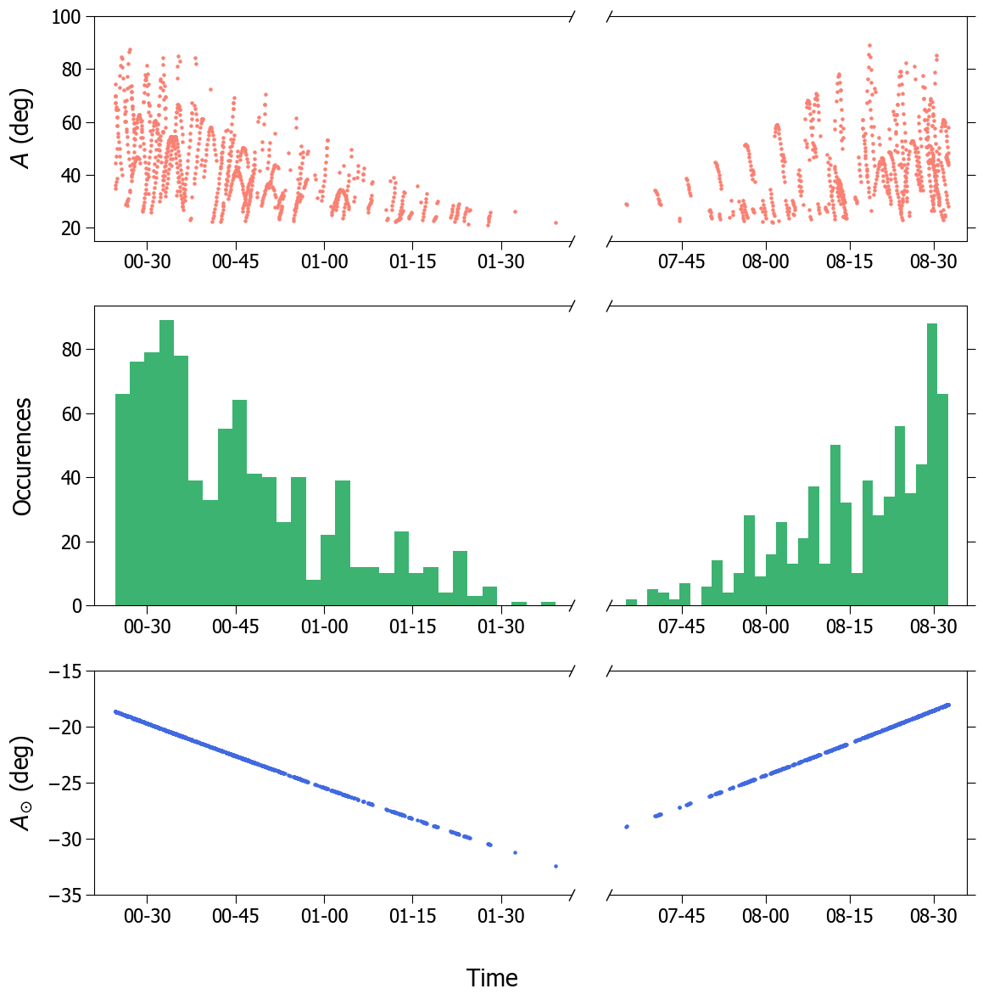

In [573]:
from datetime import datetime
fig, axes = plt.subplots(3, 2, figsize=[12,12], gridspec_kw={'width_ratios': [2, 1.5],
                                                             'height_ratios': [1.5, 2, 1.5]})

subset = df[['JD0', 'vmag_norm_1000', 'alt', 'sun_alt']].sort_values('JD0')
jds = subset['JD0']
vmags = subset['vmag_norm_1000']

times = Time(jds, format='jd') 
set_min  = datetime(2022, 10, 24, 0, 15, 0)
set_max  = datetime(2022, 10, 24, 1, 55, 0)
rise_min = datetime(2022, 10, 24, 7, 0, 0)
rise_max = datetime(2022, 10, 24, 9, 0, 0)

sunset = [dt for dt in times.datetime if set_min  < dt < set_max]
sunrise = [dt for dt in times.datetime if rise_min < dt < rise_max]
vmags_set = vmags[0:len(sunset)]
vmags_rise = vmags[-len(sunrise):]

for i, axs in enumerate(axes): 
    
    if i==1:
        #axs[0].hist(sunset,  bins=30, weights=vmags[0:len(sunset)], color='mediumseagreen')
        #axs[1].hist(sunrise, bins=30, weights=vmags[-len(sunrise):], color='mediumseagreen')
        axs[0].hist(sunset,  bins=30, color='mediumseagreen')
        axs[1].hist(sunrise, bins=30, color='mediumseagreen')
        axs[0].set_ylabel('Occurences', labelpad=10)
        
    if i==0:
        #axs[0].hist(sunset,  bins=30, weights=subset['alt'].values[0:len(sunset)], color='salmon')
        #axs[1].hist(sunrise, bins=30, weights=subset['alt'].values[-len(sunrise):], color='salmon')
        axs[0].scatter(sunset,  subset['alt'].values[0:len(sunset)], c='salmon', s=5)
        axs[1].scatter(sunrise, subset['alt'].values[-len(sunrise):], c='salmon', s=5)
        axs[0].set_ylabel(r'$A$ (deg)', labelpad=10)
        axs[0].set_ylim([15, 100])
        
    if i==2:
        #axs[0].hist(sunset,  bins=30, weights=abs(subset['sun_alt'].values[0:len(sunset)]), color='royalblue')
        #axs[1].hist(sunrise, bins=30, weights=abs(subset['sun_alt'].values[-len(sunrise):]), color='royalblue')
        axs[0].scatter(sunset,  subset['sun_alt'].values[0:len(sunset)], c='royalblue', s=5)
        axs[1].scatter(sunrise, subset['sun_alt'].values[-len(sunrise):], c='royalblue', s=5)
        axs[0].set_ylabel(r'$A_{\odot}$ (deg)', labelpad=10)
        axs[0].set_ylim([-35, -15])

    axs[0].yaxis.tick_left()
    axs[0].spines.right.set_visible(False)
    axs[1].yaxis.tick_right()
    axs[1].tick_params(labelleft=False, labelright=False)
    axs[1].spines.left.set_visible(False)
    
    axs[1].set_ylim(axs[0].get_ylim())
    
    for ax in axs:
        ax.xaxis.set_major_locator(mdates.AutoDateLocator())
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%H-%M'))
        ax.tick_params(axis='both', which='major', length=7, labelsize=16)
    
    d = 1
    break_marker = [(-0.5, -d), (0.5, d)]
    kwargs = dict(marker=break_marker, markersize=10, ls="none", c='k', mec='k', mew=1, clip_on=False)
    axs[0].plot([1, 1], [1, 0], transform=axs[0].transAxes, **kwargs)
    axs[1].plot([0, 0], [1, 0], transform=axs[1].transAxes, **kwargs)

    axs[0].set_xlim([datetime(2022, 10, 24, 0, 21, 0), datetime(2022, 10, 24, 1, 42, 0)])
    axs[1].set_xlim([datetime(2022, 10, 24, 7, 32, 0), datetime(2022, 10, 24, 8, 36, 0)])

    ax1_ticks = [datetime(2022, 10, 24, 0, 30, 0),
                 datetime(2022, 10, 24, 0, 45, 0),
                 datetime(2022, 10, 24, 1, 0, 0),
                 datetime(2022, 10, 24, 1, 15, 0),
                 datetime(2022, 10, 24, 1, 30, 0)]
    axs[0].set_xticks(ax1_ticks)

    ax2_ticks = [datetime(2022, 10, 24, 7, 45, 0),
                 datetime(2022, 10, 24, 8, 0, 0),
                 datetime(2022, 10, 24, 8, 15, 0),
                 datetime(2022, 10, 24, 8, 30, 0)]
    axs[1].set_xticks(ax2_ticks)

fig.align_ylabels()
# fig.supylabel('Occurences', fontsize=20)
fig.supxlabel('Time', fontsize=20)
plt.tight_layout()
plt.show()

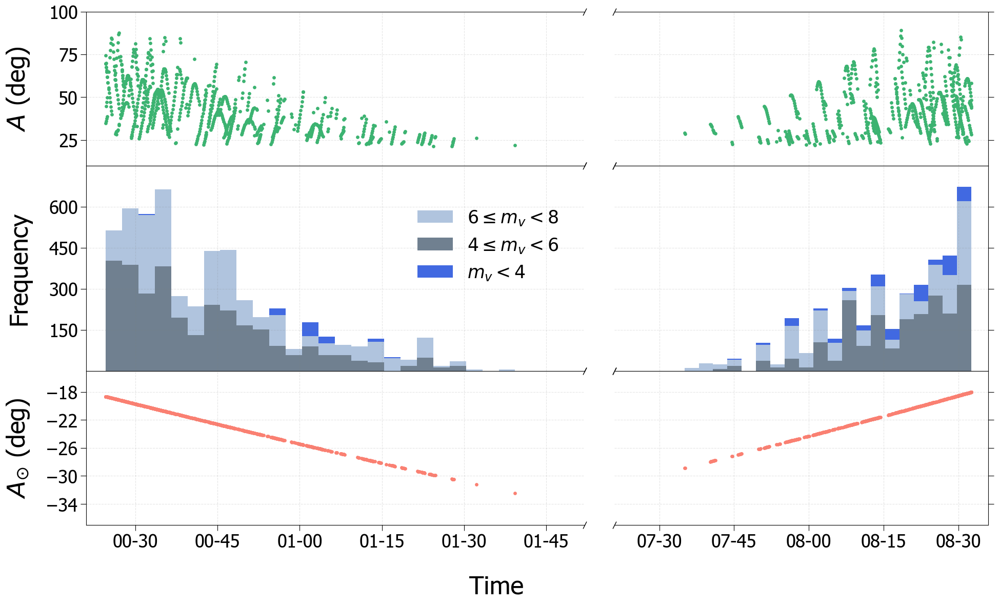

In [33]:
from datetime import datetime

fig, axes = plt.subplots(3, 2, figsize=[20,12], sharey='row', gridspec_kw={'width_ratios': [2, 1.5],
                                                                          'height_ratios': [1.5, 2, 1.5]})

subset = df[['JD0', 'vmag_norm_1000', 'alt', 'sun_alt']].sort_values('JD0')
jds = subset['JD0']
vmags = subset['vmag_norm_1000']

times = Time(jds, format='jd') 
set_min  = datetime(2022, 10, 24, 0, 15, 0)
set_max  = datetime(2022, 10, 24, 1, 55, 0)
rise_min = datetime(2022, 10, 24, 7, 0, 0)
rise_max = datetime(2022, 10, 24, 9, 0, 0)

sunset = [dt for dt in times.datetime if set_min  < dt < set_max]
sunrise = [dt for dt in times.datetime if rise_min < dt < rise_max]
vmags_set = vmags[0:len(sunset)]
vmags_rise = vmags[-len(sunrise):]



st4, st6, st8 = [], [], []
sm4, sm6, sm8 = [], [], []
for (t, m) in zip(sunset, vmags_set):
    if m < 4:
        st4.append(t)
        sm4.append(m)
    if m >= 4 and m < 6:
        st6.append(t)
        sm6.append(m)
    if m >= 6 and m < 8:
        st8.append(t)
        sm8.append(m)
        
rt4, rt6, rt8 = [], [], []
rm4, rm6, rm8 = [], [], []
for (t, m) in zip(sunrise, vmags_rise):
    if m < 4:
        rt4.append(t)
        rm4.append(m)
    if m >= 4 and m < 6:
        rt6.append(t)
        rm6.append(m)
    if m >= 6 and m < 8:
        rt8.append(t)
        rm8.append(m)

# cols = ['#44a5c2', '#ffae49', 'C3']
cols = ['slategrey', 'lightsteelblue', 'royalblue']
labs = [r'$4 \leq m_v < 6$', r'$6 \leq m_v < 8$', r'$m_v < 4$']
        
for i, axs in enumerate(axes): 
    
    if i==1:
        N = 30
        ec = 'none'
        axs[0].hist([st8, st6, st4], weights=[sm8, sm6, sm4], bins=25, ec=ec, color=cols, label=labs, stacked=True)
        axs[1].hist([rt8, rt6, rt4], weights=[rm8, rm6, rm4], bins=20, ec=ec, color=cols, stacked=True)
        #axs[0].set_yticks([200, 400, 600])
        axs[0].set_yticks([150, 300, 450, 600])
        axs[0].set_ylim([0, 750])
        axs[0].set_ylabel('Frequency', labelpad=20, fontsize=35)
        handles, labels = axs[0].get_legend_handles_labels()
        order = [1,0,2]
        axs[0].legend(
            [handles[idx] for idx in order], [labels[idx] for idx in order], 
            loc=[0.65, 0.4], fontsize=25, frameon=False) 
        
    if i==0:
        axs[0].scatter(sunset,  subset['alt'].values[0:len(sunset)], c='mediumseagreen', s=15)
        axs[1].scatter(sunrise, subset['alt'].values[-len(sunrise):], c='mediumseagreen', s=15)
        axs[0].set_ylabel(r'$A$ (deg)', labelpad=20, fontsize=35)
        axs[0].set_ylim([10, 100])
        
    if i==2:
        axs[0].scatter(sunset,  subset['sun_alt'].values[0:len(sunset)], c='salmon', s=15)
        axs[1].scatter(sunrise, subset['sun_alt'].values[-len(sunrise):], c='salmon', s=15)
        axs[0].set_ylabel(r'$A_{\odot}$ (deg)', labelpad=20, fontsize=35)
        axs[0].set_ylim([-37, -15])
        axs[0].set_yticks([-34, -30, -26, -22, -18])

    axs[0].yaxis.tick_left()
    axs[0].spines.right.set_visible(False)
    axs[1].yaxis.tick_right()
    axs[1].tick_params(labelleft=False, labelright=False)
    axs[1].spines.left.set_visible(False)
    
    axs[0].grid(color='gray', axis='both', linestyle='--', alpha=0.2, zorder=1)
    axs[1].grid(color='gray', axis='both', linestyle='--', alpha=0.2, zorder=1)
    
    for ax in axs:
        ax.xaxis.set_major_locator(mdates.AutoDateLocator())
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%H-%M'))
        ax.tick_params(axis='both', which='major', length=8, labelsize=25)
    
    d = 1
    break_marker = [(-0.5, -d), (0.5, d)]
    kwargs = dict(marker=break_marker, markersize=10, ls="none", c='k', mec='k', mew=1, clip_on=False)
    axs[0].plot([1, 1], [1, 0], transform=axs[0].transAxes, **kwargs)
    axs[1].plot([0, 0], [1, 0], transform=axs[1].transAxes, **kwargs)

    axs[0].set_xlim([datetime(2022, 10, 24, 0, 21, 0), datetime(2022, 10, 24, 1, 52, 0)])
    axs[1].set_xlim([datetime(2022, 10, 24, 7, 21, 0), datetime(2022, 10, 24, 8, 36, 0)])

    ax1_xticks = [datetime(2022, 10, 24, 0, 30, 0),
                  datetime(2022, 10, 24, 0, 45, 0),
                  datetime(2022, 10, 24, 1, 0, 0),
                  datetime(2022, 10, 24, 1, 15, 0),
                  datetime(2022, 10, 24, 1, 30, 0),
                  datetime(2022, 10, 24, 1, 45, 0)]
    axs[0].set_xticks(ax1_xticks)

    ax2_xticks = [datetime(2022, 10, 24, 7, 30, 0),
                  datetime(2022, 10, 24, 7, 45, 0),
                  datetime(2022, 10, 24, 8, 0, 0),
                  datetime(2022, 10, 24, 8, 15, 0),
                  datetime(2022, 10, 24, 8, 30, 0)]
    axs[1].set_xticks(ax2_xticks)

fig.align_ylabels()
fig.subplots_adjust(hspace=0)
fig.supxlabel('Time', fontsize=35) 
plt.setp([a.get_xticklabels() for a in fig.axes[:-2]], visible=False)
plt.tight_layout()
plt.subplots_adjust(hspace=0, bottom=0.13, left=0.1)
# plt.savefig(f'{savedir}hist_altitudes.png', dpi=300, bbox_inches='tight')
plt.show()

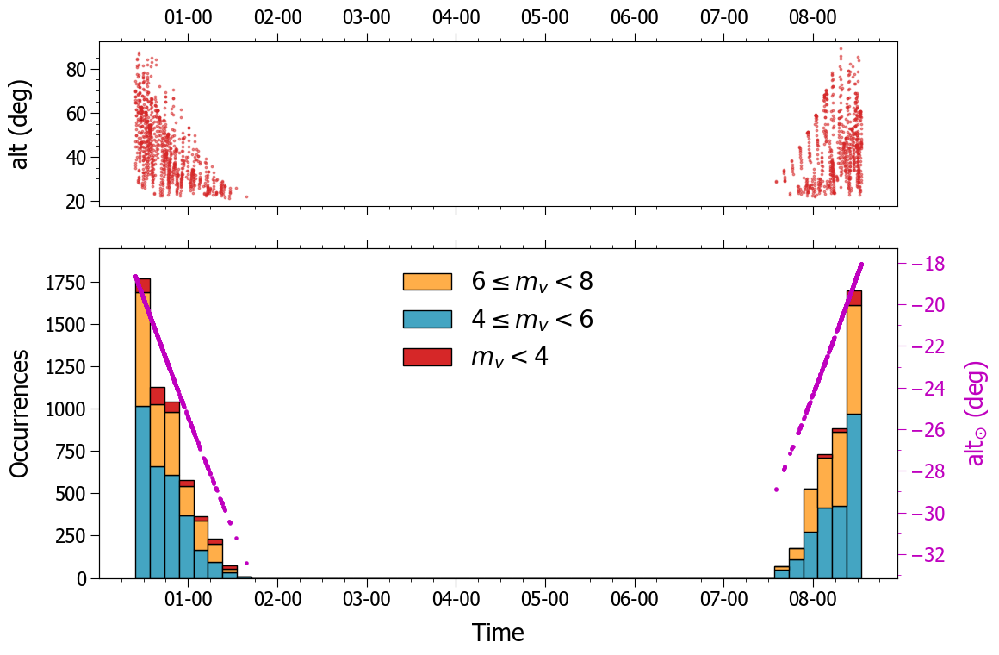

In [290]:
def time_seq_alt_both(savefig=False):

    fig, (ax1, ax) = plt.subplots(2, 1, figsize=[12,8], gridspec_kw={'height_ratios': [1, 2]})

    subset = df[['JD0', 'vmag_norm_1000', 'alt', 'sun_alt']].sort_values('JD0')
    jds = subset['JD0']
    vmags = subset['vmag_norm_1000']
    
    times = Time(jds, format='jd') 
    ax.hist(times.datetime, bins=50, weights=vmags, fc='None')
    ax.xaxis.set_major_locator(mdates.AutoDateLocator())
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%H-%M'))
    
    ax1.scatter(times.datetime, subset['alt'], s=3, c='C3', alpha=0.5)
    ax1.xaxis.set_major_locator(mdates.AutoDateLocator())
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%H-%M'))
    
    ax1.minorticks_on()
    ax1.tick_params(axis='y', which='both', direction='out', right=False)
    ax1.tick_params(axis='x', which='both', direction='out', top=True, bottom=True)
    ax1.tick_params(axis='both', which='major', length=7, labelsize=16)
    ax1.tick_params(axis='both', which='minor', length=3)
    ax1.set_ylabel('alt (deg)', labelpad=10, fontsize=20)
    
    ax1.xaxis.set_label_position('top')
    ax1.xaxis.set_ticks_position('top')
    ax1.tick_params(axis='x', which='both', bottom=True, top=True)
    
    
    t4, t6, t8 = [], [], []
    v4, v6, v8 = [], [], []
    for i, vm in enumerate(vmags):
        if vm < 4:
            t4.append(jds[i])
            v4.append(vm)
        if vm >= 4 and vm < 6:
            t6.append(jds[i])
            v6.append(vm)
        if vm >= 6 and vm < 8:
            t8.append(jds[i])
            v8.append(vm)

    t8 = Time(t8, format='jd').datetime
    t6 = Time(t6, format='jd').datetime
    t4 = Time(t4, format='jd').datetime

    cols = ['#44a5c2', '#ffae49', 'C3']
    #cols = ['lightskyblue', 'bisque', 'plum']
    labs = [r'$4 \leq m_v < 6$', r'$6 \leq m_v < 8$', r'$m_v < 4$']
    ax.hist([t8,t6,t4], bins=50, weights=[v8,v6,v4], color=cols, label=labs, ec='k', stacked=True)

    handles, labels = ax.get_legend_handles_labels()
    order = [1,0,2]
    ax.legend(
        [handles[idx] for idx in order], [labels[idx] for idx in order], 
        loc='upper center', fontsize=20, frameon=False) 

    ax.minorticks_on()
    ax.tick_params(axis='y', which='both', direction='out', right=False)
    ax.tick_params(axis='x', which='both', direction='out', top=True)
    ax.tick_params(axis='both', which='major', length=7, labelsize=16)
    ax.tick_params(axis='both', which='minor', length=3)
    ax.set_ylabel('Occurrences', labelpad=10, fontsize=20)
    ax.set_xlabel('Time', fontsize=20, labelpad=10)
    ax.yaxis.set_minor_locator(ticker.MultipleLocator(base=250))
    
    
    # Sun altitude
    twin = ax.twinx()
    twin.scatter(times.datetime, subset['sun_alt'], s=5, c='m')
        
    twin.tick_params(axis='y', which='major', length=7, labelsize=16)
    twin.set_ylabel(r'alt$_{\odot}$ (deg)', fontsize=20, labelpad=15)
    twin.yaxis.label.set_color('m')
    twin.tick_params(axis='y', which='both', colors='m')
    twin.minorticks_on()
    twin.tick_params(axis='y', which='minor', length=3)
    twin.yaxis.set_minor_locator(ticker.MultipleLocator(base=1))

    fig.align_ylabels()
    plt.tight_layout()
    if savefig:
        plt.savefig(f'{savedir}time_seq_alt.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    

time_seq_alt_both(savefig=False)

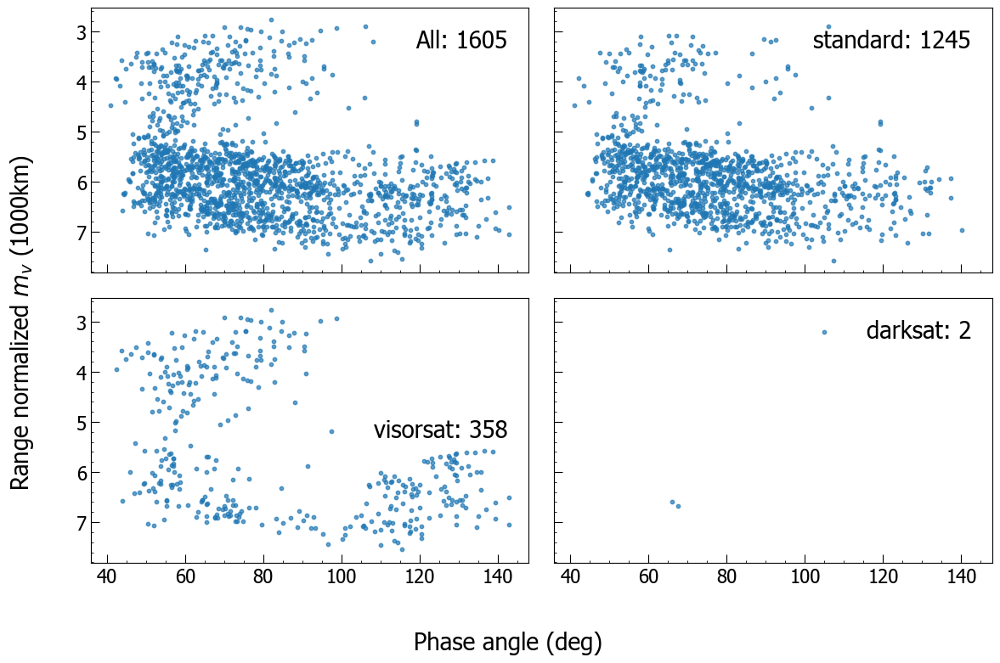

In [43]:
def phase_angle(savefig=False):
    
    fig, axs = plt.subplots(2, 2, figsize=[12,8], sharey=True, sharex=True)

    axs[0,0].scatter(df.phase_angle, df.vmag_norm_1000, s=10, c='C0', alpha=0.7, label=f'All: {len(df)}')
    axs[0,0].invert_yaxis()

    for sattype, ax in zip(['standard', 'visorsat', 'darksat'], axs.ravel()[1:]):
        ax.scatter(df[df['type']==sattype].phase_angle, df[df['type']==sattype].vmag_norm_1000, 
                  label=f"{sattype}: {len(df[df['type']==sattype])}", s=10, c='C0', alpha=0.7)

    for ax in axs.flat:
        ax.minorticks_on()
        ax.tick_params(axis='y', which='both', direction='in', right=False)
        ax.tick_params(axis='x', which='both', direction='in', top=False)
        ax.tick_params(axis='both', which='major', length=7, labelsize=16)
        ax.tick_params(axis='both', which='minor', length=2)
        ax.legend(fontsize=20, frameon=False)

    supylabel = fig.supylabel(r'Range normalized $m_v$ (1000km)', fontsize=20)
    supylabel.set_position((0.01, 0.5))
    fig.supxlabel('Phase angle (deg)', fontsize=20)

    plt.tight_layout() 
    if savefig:
        plt.savefig(f'{savedir}phase_angle.png', dpi=300, bbox_inches='tight')
    plt.show()
    
phase_angle(savefig=False)

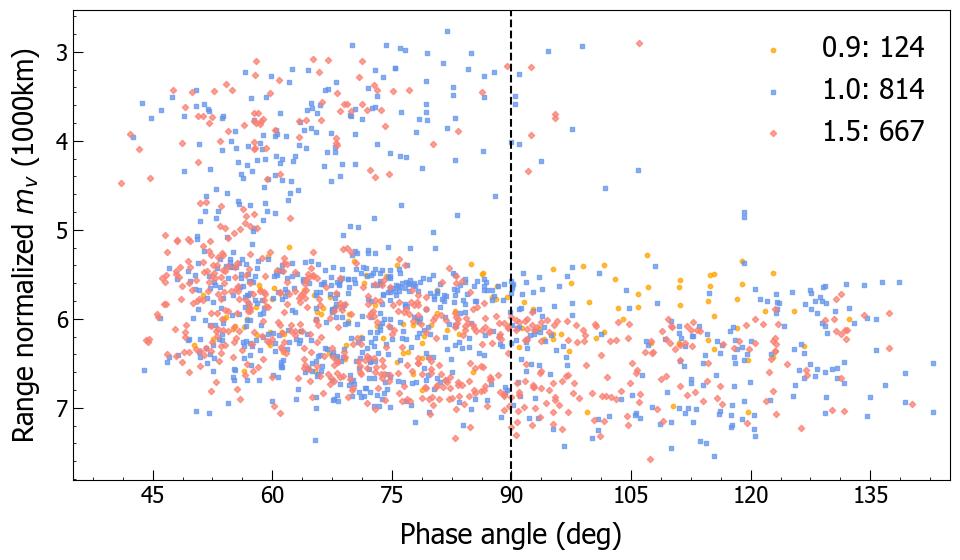

In [77]:
def phase_angle(savefig=False):
    
    fig, ax = plt.subplots(1, 1, figsize=[10,6])
    
    cols = ['cornflowerblue', 'orange', 'k']
    mrks = ['o', 's', 'D']

#     for i, sattype in enumerate(['standard', 'visorsat', 'darksat']):
#         ax.scatter(df[df['type']==sattype].phase_angle, df[df['type']==sattype].vmag_norm_1000, 
#                   label=f"{sattype}: {len(df[df['type']==sattype])}", marker=mrks[i], s=20, c=cols[i], alpha=0.75)

    cols = ['orange', 'cornflowerblue', 'salmon']
    for i, vers in enumerate(['0.9', '1.0', '1.5']):        
        ax.scatter(df[df['version']==vers].phase_angle, df[df['version']==vers].vmag_norm_1000, 
                  label=f"{vers}: {len(df[df['version']==vers])}", marker=mrks[i], s=10, c=cols[i], alpha=0.75)

    ax.minorticks_on()
    ax.tick_params(axis='y', which='both', direction='in', right=False)
    ax.tick_params(axis='x', which='both', direction='in', top=False)
    ax.tick_params(axis='both', which='major', length=7, labelsize=16)
    ax.tick_params(axis='both', which='minor', length=2)
    ax.legend(fontsize=20, frameon=False)
    ax.invert_yaxis()

    ax.set_ylabel(r'Range normalized $m_v$ (1000km)', fontsize=20, labelpad=10)
    ax.set_xlabel('Phase angle (deg)', fontsize=20, labelpad=10)
    
    ax.axvline(90, ls='--', c='k')
    ax.set_xlim([35, 145])
    ax.set_xticks([45, 60, 75, 90, 105, 120, 135])

    plt.tight_layout() 
    if savefig:
        plt.savefig(f'{savedir}phase_angle.png', dpi=300, bbox_inches='tight')
    plt.show()
    
phase_angle(savefig=False)

In [41]:
# df.to_csv('starlink_observations.csv', index=False)

In [26]:
## phase angle: the angle between the observer on Earth, the satellite and the Sun

# test_time = 2459411.52000000
# test_sat = 'STARLINK-2198'

test_time = df.JD0.iloc[0]
test_sat = df.satname.iloc[0]

tles = get_starlink_tles()
for idx, line in enumerate(tles):
    if line[0] == test_sat:
        break
        
ts = load.timescale()
obs_time = ts.ut1_jd(test_time)
sat = EarthSatellite(tles[idx][1], tles[idx][2], tles[idx][0], ts)  

eph = load('de421.bsp')
sun = eph['sun']
earth = eph['earth']

site = get_siteinfo()
mascara = wgs84.latlon(latitude_degrees=site[0][1], longitude_degrees=site[0][2], elevation_m=site[0][3])
observer = mascara + earth
sat_pov = earth + sat
phase_angle = observer.at(obs_time).observe(sat_pov).phase_angle(sun)

print(phase_angle.degrees)

70.02527022699273


In [43]:
test = df[['satname','vmag_norm_1000', 'JD0']]
test = test.drop_duplicates(subset=['satname'])

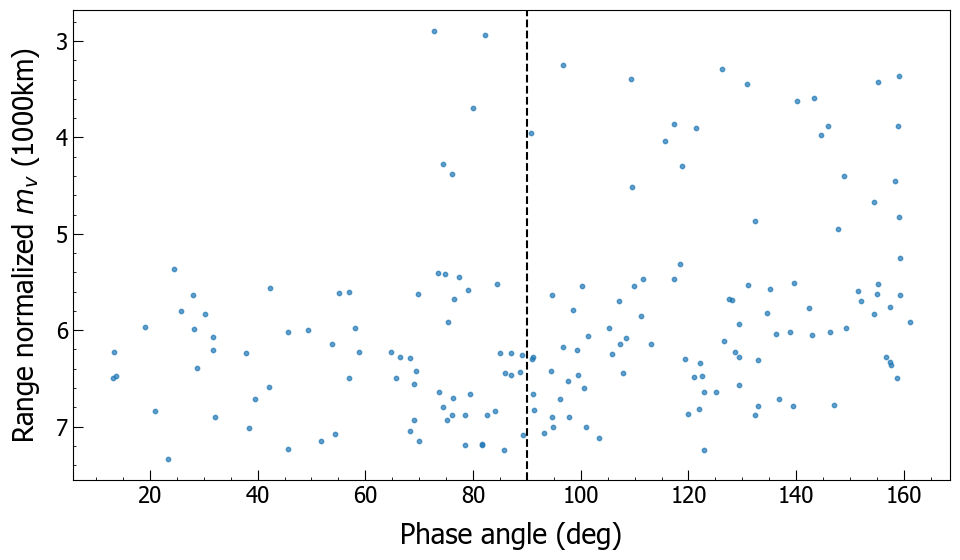

In [45]:
site = get_siteinfo()
mascara = wgs84.latlon(latitude_degrees=site[0][1], longitude_degrees=site[0][2], elevation_m=site[0][3])
observer = mascara + earth

tles = get_starlink_tles()
ts = load.timescale()
phi = []
for index, row in test.iterrows():
    satname = row.satname
    jd = row.JD0
    t = ts.ut1_jd(jd)
    for idx, line in enumerate(tles):
        if line[0] == test_sat:
            break
    sat = EarthSatellite(tles[idx][1], tles[idx][2], tles[idx][0], ts)  
    sat_pov = earth + sat
    phase_angle = observer.at(t).observe(sat_pov).phase_angle(sun)
    phi.append(phase_angle.degrees)


fig, ax = plt.subplots(1, 1, figsize=[10,6])

ax.scatter(phi, test.vmag_norm_1000, s=10, c='C0', alpha=0.7)

ax.minorticks_on()
ax.tick_params(axis='y', which='both', direction='in', right=False)
ax.tick_params(axis='x', which='both', direction='in', top=False)
ax.tick_params(axis='both', which='major', length=7, labelsize=16)
ax.tick_params(axis='both', which='minor', length=2)
ax.invert_yaxis()
ax.set_ylabel(r'Range normalized $m_v$ (1000km)', fontsize=20, labelpad=10)
ax.set_xlabel('Phase angle (deg)', fontsize=20, labelpad=10)
ax.axvline(90, ls='--', c='k')

plt.tight_layout() 
plt.show()

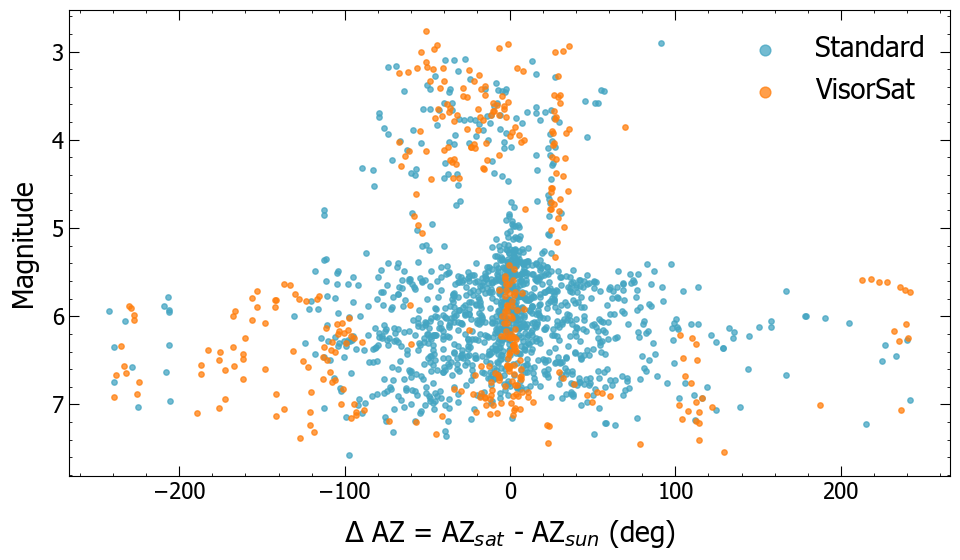

In [42]:
def az_diff(savefig=False):
    
    # Should expect to see brightest magnitudes at az_diff = 0
    fig, ax = plt.subplots(1, 1, figsize=[10,6])
    
    subset = df[df['type'] == 'standard'][['vmag_norm_1000', 'az', 'sun_az']]
    diff = subset.az - subset.sun_az
    ax.scatter(diff, subset.vmag_norm_1000, c='#44a5c2', s=15, alpha=0.75, label='Standard')
    
    subset = df[df['type'] == 'visorsat'][['vmag_norm_1000', 'az', 'sun_az']]
    diff = subset.az - subset.sun_az
    ax.scatter(diff, subset.vmag_norm_1000, c='C1', s=15, alpha=0.75, label='VisorSat')

    leg = ax.legend(fontsize=20, markerscale=2, frameon=False)
    ax.invert_yaxis()

    ax.minorticks_on()
    ax.tick_params(axis='y', which='both', direction='in', right=True)
    ax.tick_params(axis='x', which='both', direction='in', top=True)
    ax.tick_params(axis='both', which='major', length=7, labelsize=16)
    ax.tick_params(axis='both', which='minor', length=2)
    ax.set_ylabel('Magnitude', labelpad=10, fontsize=20)
    ax.set_xlabel(r'$\Delta$ AZ = AZ$_{sat}$ - AZ$_{sun}$ (deg)', fontsize=20, labelpad=10)
    
    plt.tight_layout()
    if savefig:
        plt.savefig(f'{savedir}az_diff.png', dpi=300, bbox_inches='tight')
    plt.show()

    
az_diff(savefig=False)

## Affected area (stellar annuli)

In [5]:
def get_barplot_data():   
    
    nx = 4008                                                  
    ny = 2672 
    img_area = nx*ny
    
    files = []
    camid_order = ['LSN', 'LSS', 'LSW', 'LSE', 'LSC']
    for i in camid_order:
        files.extend(glob.glob(f'{datadir}vmags_july/vmags_{i}.p'))

    set_min  = datetime(2022, 10, 24, 0, 15, 0)
    set_max  = datetime(2022, 10, 24, 1, 55, 0)
    rise_min = datetime(2022, 10, 24, 7, 0, 0)
    rise_max = datetime(2022, 10, 24, 9, 0, 0)

    area_per_sat_per_camid = []
    time_per_camid = []
    area_per_camid = []
    for f in files:
        time = []
        area = []
        area_per_sat = []
        p = pd.read_pickle(f)
        for lstseq in p.keys():
            jd = p[lstseq]['JD0']
            time.append(jd)
            if len(p[lstseq]) <= 2:
                area.append(0)
                continue
            sats = list(p[lstseq])[2:]

            annuli = [] 
            for sat in sats:
                annuli.append(p[lstseq][sat]['annulus'])
            area.append((np.sum(annuli)/img_area)*100)

            x = len(sats)/3173 #how many starlinks in image relative to total population at time of observation
            area_per_sat.append((np.sum(annuli)*x))

        area_per_camid.append(area)
        time = Time(time, format='jd')
        time_per_camid.append(time)
        area_per_sat_per_camid.append(area_per_sat)


    set_area_cam = []
    set_time_cam = []
    rise_area_cam = []
    rise_time_cam = []

    for time, area in zip(time_per_camid, area_per_camid):
        sunset  = [dt for dt in time.datetime if set_min  < dt < set_max]
        sunrise = [dt for dt in time.datetime if rise_min < dt < rise_max] 

        set_time_cam.append(sunset)
        rise_time_cam.append(sunrise)

        set_area_cam.append(area[:len(sunset)])
        rise_area_cam.append(area[-len(sunrise):])
        
    return set_time_cam, rise_time_cam, set_area_cam, rise_area_cam, area_per_sat_per_camid

In [6]:
set_time_cam, rise_time_cam, set_area_cam, rise_area_cam, area_per_sat_per_camid = get_barplot_data()

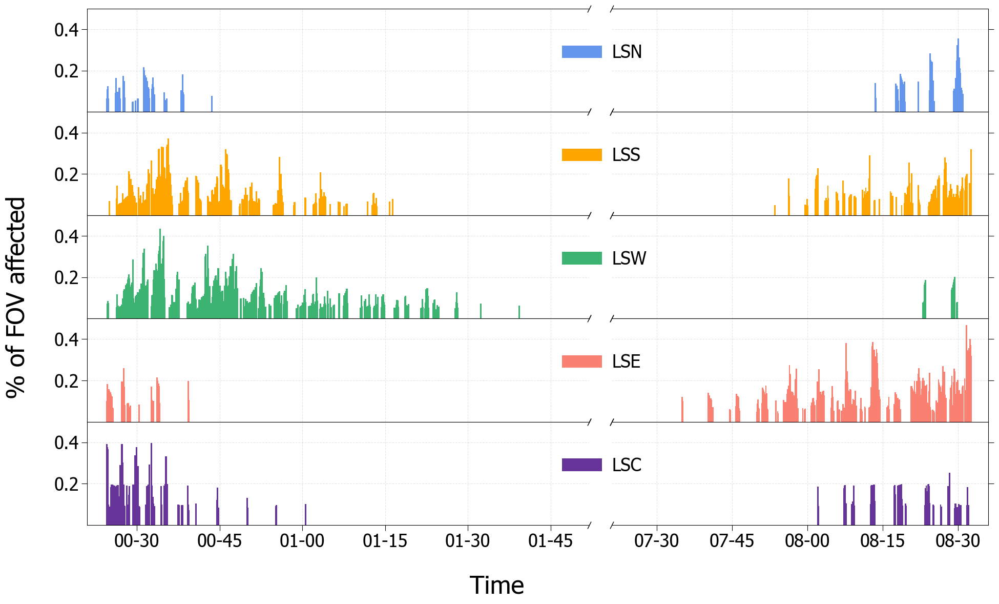

In [6]:
fig, axes = plt.subplots(5, 2, figsize=[20,12], sharey=True, gridspec_kw={'width_ratios': [2, 1.5]})

labels = ['LSN', 'LSS', 'LSW', 'LSE', 'LSC']
cols = ['cornflowerblue', 'orange', 'mediumseagreen', 'salmon', 'rebeccapurple']

idx = 0
for i, axs in enumerate(axes):

    axs[0].bar(set_time_cam[i], set_area_cam[i], width=0.0002, label=labels[idx], zorder=2, color=cols[i])
    axs[1].bar(rise_time_cam[i], rise_area_cam[i], width=0.0002, label=labels[idx], zorder=2, color=cols[i])

    axs[0].yaxis.tick_left()
    axs[0].spines.right.set_visible(False)
    axs[1].yaxis.tick_right()
    axs[1].tick_params(labelleft=False, labelright=False)
    axs[1].spines.left.set_visible(False)
    axs[0].set_ylim([0, 0.5])
    axs[0].set_yticks([0.2, 0.4])
    axs[0].grid(color='gray', axis='both', linestyle='--', alpha=0.2, zorder=1)
    axs[1].grid(color='gray', axis='both', linestyle='--', alpha=0.2, zorder=1)

    for ax in axs:
        ax.xaxis.set_major_locator(mdates.AutoDateLocator())
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%H-%M'))
        ax.tick_params(axis='both', which='major', length=8, labelsize=25)

    d = 1
    break_marker = [(-0.5, -d), (0.5, d)]
    kwargs = dict(marker=break_marker, markersize=10, ls="none", c='k', mec='k', mew=1, clip_on=False)
    axs[0].plot([1, 1], [1, 0], transform=axs[0].transAxes, **kwargs)
    axs[1].plot([0, 0], [1, 0], transform=axs[1].transAxes, **kwargs)

    axs[0].set_xlim([datetime(2022, 10, 24, 0, 21, 0), datetime(2022, 10, 24, 1, 52, 0)])
    axs[1].set_xlim([datetime(2022, 10, 24, 7, 21, 0), datetime(2022, 10, 24, 8, 36, 0)])

    ax1_xticks = [datetime(2022, 10, 24, 0, 30, 0),
                  datetime(2022, 10, 24, 0, 45, 0),
                  datetime(2022, 10, 24, 1, 0, 0),
                  datetime(2022, 10, 24, 1, 15, 0),
                  datetime(2022, 10, 24, 1, 30, 0),
                  datetime(2022, 10, 24, 1, 45, 0)]
    axs[0].set_xticks(ax1_xticks)

    ax2_xticks = [datetime(2022, 10, 24, 7, 30, 0),
                  datetime(2022, 10, 24, 7, 45, 0),
                  datetime(2022, 10, 24, 8, 0, 0),
                  datetime(2022, 10, 24, 8, 15, 0),
                  datetime(2022, 10, 24, 8, 30, 0)]
    axs[1].set_xticks(ax2_xticks)

    idx += 1

fig.subplots_adjust(hspace=0)
fig.supylabel('% of FOV affected', fontsize=35)
fig.supxlabel('Time', fontsize=35) 
plt.setp([a.get_xticklabels() for a in fig.axes[:-2]], visible=False)
plt.tight_layout()
plt.subplots_adjust(hspace=0, bottom=0.13, left=0.1)
for axs in axes:
    # Lmao this is so hack-y
    axs[0].legend(loc=(0.94, 0.42),  fontsize=25, frameon=False)
    axs[1].legend(loc=(-0.15, 0.42), fontsize=25, frameon=False)
# plt.savefig(f'{savedir}affected_area_2.png', dpi=300, bbox_inches='tight')
plt.show()

# Percentage of observations affected during these hours?

In [22]:
N = 0
A = 0
for cam in set_area_cam:
    N += len(cam)
    for img in cam:
        if img != 0:
            A += 1

print('% of images affected during NON twilight hours across all cameras:', (A/N)*100)

labels = ['LSN', 'LSS', 'LSW', 'LSE', 'LSC']
for label, cam in zip(labels, set_area_cam):
    A = 0
    N = len(cam)
    for img in cam:
        if img != 0:
            A += 1
    print(f'{label}:', (A/N)*100)

N = 0
A = []
for cam in set_area_cam:
    N += len(cam)
    A.extend(cam)
print('\nAverage percentage affected across all cameras:', np.mean(A)) #note, contains many zero values since Earth's shadow etc
print('Max from all cameras:', max(A))

% of images affected during NON twilight hours across all cameras: 39.128151260504204
LSN: 15.916955017301039
LSS: 38.397328881469114
LSW: 58.08580858085809
LSE: 20.35928143712575
LSC: 34.15637860082305

Average percentage affected across all cameras: 0.04869772701113146
Max from all cameras: 0.4360758273871419


In [23]:
def combined_fov_area():

    nx = 4008                                                  
    ny = 2672 
    fov_area = (nx*ny)*5
    lstseqs = []
    lsn, lss, lsw, lse, lsc = [], [], [], [], []
    
    files = []
    camid_order = ['LSN', 'LSS', 'LSW', 'LSE', 'LSC']
    for i in camid_order:
        files.extend(glob.glob(f'{datadir}vmags_july/vmags_{i}.p'))

    for f in files:
        p = pd.read_pickle(f)
        lstseqs.extend(p.keys())
    
    for lstseq in np.unique(lstseqs):         
        for (f, camid) in zip(files, [lsn, lss, lsw, lse, lsc]):
            vmags = pd.read_pickle(f)
            if lstseq not in vmags.keys():
                camid.append(0)
                continue

            satnums = list(vmags[lstseq])[2:]
            annuli = []
            if len(satnums) != 0:
                for satnum in satnums:
                    annuli.append(vmags[lstseq][satnum]['annulus'])
                camid.append(np.sum(annuli))
            else:
                camid.append(0)

    percentage = []
    for i in range(len(lsc)):
        x = lsc[i] + lse[i] + lsn[i] + lss[i] + lsw[i]
        p = (x/fov_area) * 100
        percentage.append(p)

    return percentage
    

p = combined_fov_area()

In [27]:
print('Max percentage affected for combined FOV:', max(p))
print('Avergae:', np.mean(p))

Max percentage affected for combined FOV: 0.17819338867175827
Avergae: 0.027819374876677107


In [34]:
print(np.mean(df[df.type=='visorsat'].vmag_norm_1000))
print(np.std(df[df.type=='visorsat'].vmag_norm_1000))

print(np.mean(df[df.type=='darksat'].vmag_norm_1000))
print(np.std(df[df.type=='darksat'].vmag_norm_1000))

print(np.mean(df.vmag_norm_1000))
print(np.std(df.vmag_norm_1000))

x = len(df[df.vmag_norm_1000 < 7])
y = (x/len(df))*100
print(y)

x = len(df[df.vmag_norm_550 < 7])
y = (x/len(df))*100
print(y)

test = df[df.version=='1.5']
x = len(test[test.vmag_norm_550 < 7])
y = (x/len(test))*100
print(y)
print(len(test))

5.584035148598418
1.3366902075248714
6.63506404733312
0.048046432780138204
5.807818259461355
0.9546690867897869
94.89096573208722
99.62616822429906
99.40029985007496
667


In [17]:
maxval = 0
for a, b in zip(set_area_cam, rise_area_cam):
    if max(a) > maxval:
        maxval = max(a)
    if max(b) > maxval:
        maxval = max(b)
print(maxval)

0.46704868705702374


In [40]:
# How much area affected relative to how many starlink trail present - could give indication of future numbers
nx = 4008                                                  
ny = 2672 
img_area = nx*ny

# assume fleet grows to 40000 and the 400000

test_40k = []
test_400k = []

for cam in area_per_sat_per_camid:
    a = []
    b = []
    for val in cam:
        a.append(((val*40000)/img_area)*100)
        b.append(((val*400000)/img_area)*100)
    test_40k.append(a)
    test_400k.append(b)
    

In [9]:
def projected_area_data():

    nx = 4008                                                  
    ny = 2672 
    fov_area = (nx*ny)*5
    lstseqs = []
    lsn, lss, lsw, lse, lsc = [], [], [], [], []
    
    files = []
    camid_order = ['LSN', 'LSS', 'LSW', 'LSE', 'LSC']
    for i in camid_order:
        files.extend(glob.glob(f'{datadir}vmags_july/vmags_{i}.p'))

    for f in files:
        p = pd.read_pickle(f)
        lstseqs.extend(p.keys())
    
    jds = []
    for lstseq in np.unique(lstseqs): 
        x = len(jds)
        
        for (f, camid) in zip(files, [lsn, lss, lsw, lse, lsc]):
            vmags = pd.read_pickle(f)
            if lstseq not in vmags.keys():
                camid.append(0)
                continue

            satnums = list(vmags[lstseq])[2:]
            annuli = []
            if len(satnums) != 0:
                for satnum in satnums:
                    annuli.append(vmags[lstseq][satnum]['annulus'])
                z = len(satnums)/3173 #how many starlinks in image relative to total population at time of observation
                camid.append((np.sum(annuli)*z))
            else:
                camid.append(0)
                
            if (len(jds) == 0) | (len(jds) == x):
                jds.append(vmags[lstseq]['JD0'])
    
    perc_40k = []
    perc_500k = []
    for i in range(len(lsc)):
        x = lsc[i] + lse[i] + lsn[i] + lss[i] + lsw[i]
        p40 = ((x*40000)/fov_area) * 100
        p500 = ((x*500000)/fov_area) * 100
        perc_40k.append(p40)
        perc_500k.append(p500)

    timerange = Time(jds, format='jd')

    set_min  = datetime(2022, 10, 24, 0, 15, 0)
    set_max  = datetime(2022, 10, 24, 1, 55, 0)
    rise_min = datetime(2022, 10, 24, 7, 0, 0)
    rise_max = datetime(2022, 10, 24, 9, 0, 0)

    set_time = []
    rise_time = []
    for t in timerange:
        if set_min  < t.datetime < set_max:
            set_time.append(t.datetime)
        if rise_min  < t.datetime < rise_max:
            rise_time.append(t.datetime)
    
    return set_time, rise_time, perc_40k, perc_500k

In [10]:
set_time, rise_time, perc_40k, perc_500k = projected_area_data()

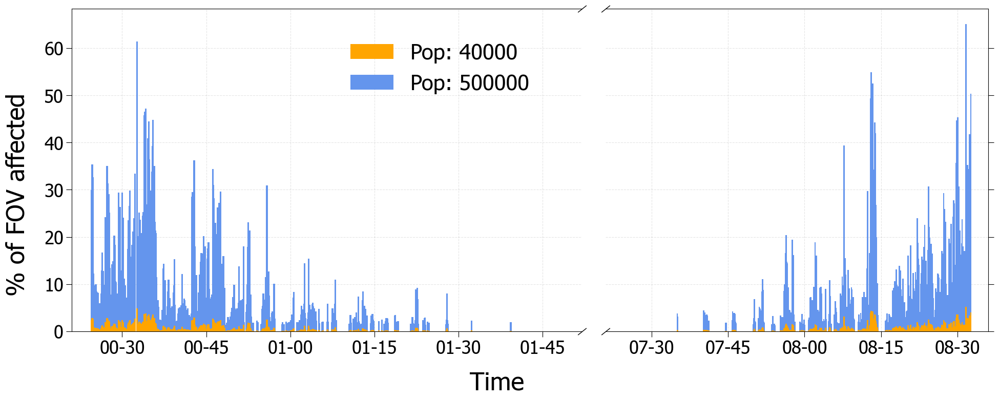

In [20]:
def projected_interference(savefig=False):
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=[20,8], sharey=True, gridspec_kw={'width_ratios': [2, 1.5]})


    ax1.bar(set_time, perc_500k[0:len(set_time)], width=0.0002, zorder=2, color='cornflowerblue', label='Pop: 500000')
    ax2.bar(rise_time, perc_500k[-len(rise_time):], width=0.0002, zorder=2, color='cornflowerblue')

    ax1.bar(set_time, perc_40k[0:len(set_time)], width=0.0002, zorder=3, color='orange', label='Pop: 40000')
    ax2.bar(rise_time, perc_40k[-len(rise_time):], width=0.0002, zorder=3, color='orange')

    ax1.yaxis.tick_left()
    ax1.spines.right.set_visible(False)
    ax2.yaxis.tick_right()
    ax2.tick_params(labelleft=False, labelright=False)
    ax2.spines.left.set_visible(False)
    ax1.grid(color='gray', axis='both', linestyle='--', alpha=0.2, zorder=1)
    ax2.grid(color='gray', axis='both', linestyle='--', alpha=0.2, zorder=1)
    
    handles, labels = ax1.get_legend_handles_labels()
    order = [1,0]
    ax1.legend(
        [handles[idx] for idx in order], [labels[idx] for idx in order], 
        loc=[0.53, 0.71], fontsize=30, frameon=False) 

    for ax in [ax1,ax2]:
        ax.xaxis.set_major_locator(mdates.AutoDateLocator())
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%H-%M'))
        ax.tick_params(axis='both', which='major', length=8, labelsize=25)

    d = 0.8
    kwargs = dict(marker=[(-1, -d), (1, d)], markersize=12, linestyle="none", 
                  color='k', mec='k', mew=1, clip_on=False)
    ax1.plot([1, 1], [1, 0], transform=ax1.transAxes, **kwargs)
    ax2.plot([0, 0], [1, 0], transform=ax2.transAxes, **kwargs)

    ax1.set_xlim([datetime(2022, 10, 24, 0, 21, 0), datetime(2022, 10, 24, 1, 52, 0)])
    ax2.set_xlim([datetime(2022, 10, 24, 7, 21, 0), datetime(2022, 10, 24, 8, 36, 0)])

    ax1_xticks = [datetime(2022, 10, 24, 0, 30, 0),
                  datetime(2022, 10, 24, 0, 45, 0),
                  datetime(2022, 10, 24, 1, 0, 0),
                  datetime(2022, 10, 24, 1, 15, 0),
                  datetime(2022, 10, 24, 1, 30, 0),
                  datetime(2022, 10, 24, 1, 45, 0)]
    ax1.set_xticks(ax1_xticks)

    ax2_xticks = [datetime(2022, 10, 24, 7, 30, 0),
                  datetime(2022, 10, 24, 7, 45, 0),
                  datetime(2022, 10, 24, 8, 0, 0),
                  datetime(2022, 10, 24, 8, 15, 0),
                  datetime(2022, 10, 24, 8, 30, 0)]
    ax2.set_xticks(ax2_xticks)

    fig.supylabel('% of FOV affected', fontsize=35)
    fig.supxlabel('Time', fontsize=35) 
    plt.tight_layout()
    plt.subplots_adjust(bottom=0.165, left=0.085)
    if savefig:
        plt.savefig(f'{savedir}projected_interference_2.png', dpi=300, bbox_inches='tight')
    plt.show()
        
projected_interference(savefig=True)

In [12]:
print(max(perc_40k))
print(max(perc_500k))

5.2046019964238415
65.05752495529802


In [ ]:
def projected_interference(savefig=False):
    
    fig, axes = plt.subplots(2, 2, figsize=[20,12], sharey='row', gridspec_kw={'width_ratios': [2, 1.5]})


    for axs, data in zip(axes, [perc_40k, perc_400k]):
        axs[0].bar(set_time, data[0:len(set_time)], width=0.0002, zorder=2)
        axs[1].bar(rise_time, data[-len(rise_time):], width=0.0002, zorder=2)
    
        axs[0].yaxis.tick_left()
        axs[0].spines.right.set_visible(False)
        axs[1].yaxis.tick_right()
        axs[1].tick_params(labelleft=False, labelright=False)
        axs[1].spines.left.set_visible(False)
        axs[0].grid(color='gray', axis='both', linestyle='--', alpha=0.2, zorder=1)
        axs[1].grid(color='gray', axis='both', linestyle='--', alpha=0.2, zorder=1)
    
        for ax in axs:
            ax.xaxis.set_major_locator(mdates.AutoDateLocator())
            ax.xaxis.set_major_formatter(mdates.DateFormatter('%H-%M'))
    
        d = 0.8
        kwargs = dict(marker=[(-1, -d), (1, d)], markersize=12, linestyle="none", 
                      color='k', mec='k', mew=1, clip_on=False)
        axs[0].plot([1, 1], [1, 0], transform=axs[0].transAxes, **kwargs)
        axs[1].plot([0, 0], [1, 0], transform=axs[1].transAxes, **kwargs)
    
        axs[0].set_xlim([datetime(2022, 10, 24, 0, 21, 0), datetime(2022, 10, 24, 1, 52, 0)])
        axs[1].set_xlim([datetime(2022, 10, 24, 7, 21, 0), datetime(2022, 10, 24, 8, 36, 0)])
    
        ax1_xticks = [datetime(2022, 10, 24, 0, 30, 0),
                      datetime(2022, 10, 24, 0, 45, 0),
                      datetime(2022, 10, 24, 1, 0, 0),
                      datetime(2022, 10, 24, 1, 15, 0),
                      datetime(2022, 10, 24, 1, 30, 0),
                      datetime(2022, 10, 24, 1, 45, 0)]
        axs[0].set_xticks(ax1_xticks)
    
        ax2_xticks = [datetime(2022, 10, 24, 7, 30, 0),
                      datetime(2022, 10, 24, 7, 45, 0),
                      datetime(2022, 10, 24, 8, 0, 0),
                      datetime(2022, 10, 24, 8, 15, 0),
                      datetime(2022, 10, 24, 8, 30, 0)]
        axs[1].set_xticks(ax2_xticks)

    fig.subplots_adjust(hspace=0)
    fig.supylabel('% of FOV affected', fontsize=35)
    fig.supxlabel('Time', fontsize=35) 
    plt.setp([a.get_xticklabels() for a in fig.axes[:-2]], visible=False)
    plt.tight_layout()
    plt.subplots_adjust(hspace=0, bottom=0.13, left=0.1)
    if savefig:
        plt.savefig(f'{savedir}projected_interference.png', dpi=300, bbox_inches='tight')
    plt.show()
        
projected_interference(savefig=False)

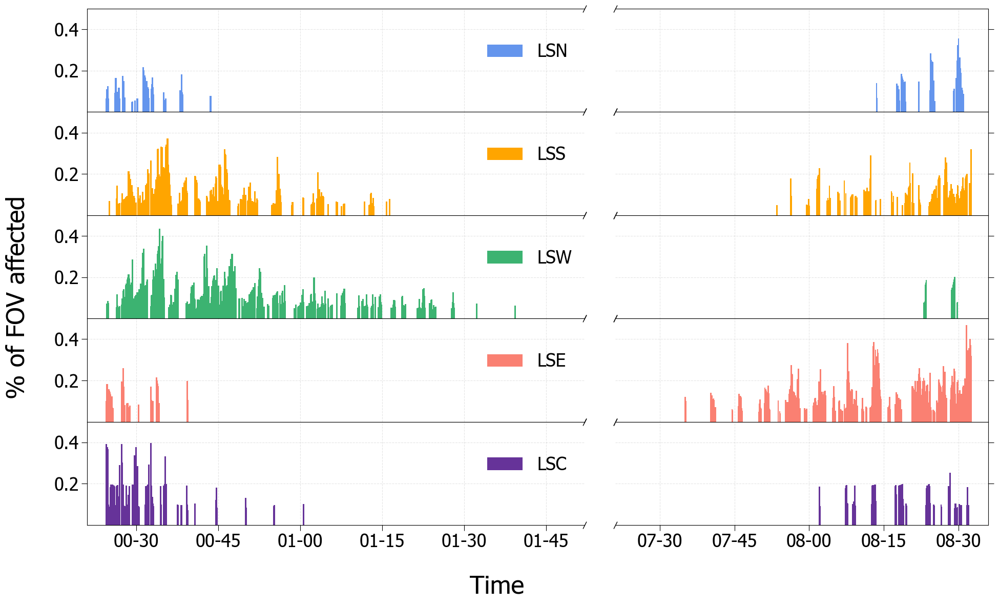

In [624]:
fig, axes = plt.subplots(5, 2, figsize=[20,12], sharey=True, gridspec_kw={'width_ratios': [2, 1.5]})

labels = ['LSN', 'LSS', 'LSW', 'LSE', 'LSC']
cols = ['cornflowerblue', 'orange', 'mediumseagreen', 'salmon', 'rebeccapurple']

idx = 0
for i, axs in enumerate(axes):

    axs[0].bar(set_time_cam[i], set_area_cam[i], width=0.0002, label=labels[idx], zorder=2, color=cols[i])
    axs[1].bar(rise_time_cam[i], rise_area_cam[i], width=0.0002, label=labels[idx], zorder=2, color=cols[i])

    axs[0].yaxis.tick_left()
    axs[0].spines.right.set_visible(False)
    axs[1].yaxis.tick_right()
    axs[1].tick_params(labelleft=False, labelright=False)
    axs[1].spines.left.set_visible(False)
    axs[0].set_ylim([0, 0.5])
    axs[0].set_yticks([0.2, 0.4])
    axs[0].grid(color='gray', axis='both', linestyle='--', alpha=0.2, zorder=1)
    axs[1].grid(color='gray', axis='both', linestyle='--', alpha=0.2, zorder=1)
    axs[0].legend(loc=[0.79, 0.43], fontsize=25, frameon=False)

    for ax in axs:
        ax.xaxis.set_major_locator(mdates.AutoDateLocator())
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%H-%M'))
        ax.tick_params(axis='both', which='major', length=8, labelsize=25)

    d = 1
    break_marker = [(-0.5, -d), (0.5, d)]
    kwargs = dict(marker=break_marker, markersize=10, ls="none", c='k', mec='k', mew=1, clip_on=False)
    axs[0].plot([1, 1], [1, 0], transform=axs[0].transAxes, **kwargs)
    axs[1].plot([0, 0], [1, 0], transform=axs[1].transAxes, **kwargs)

    axs[0].set_xlim([datetime(2022, 10, 24, 0, 21, 0), datetime(2022, 10, 24, 1, 52, 0)])
    axs[1].set_xlim([datetime(2022, 10, 24, 7, 21, 0), datetime(2022, 10, 24, 8, 36, 0)])

    ax1_xticks = [datetime(2022, 10, 24, 0, 30, 0),
                  datetime(2022, 10, 24, 0, 45, 0),
                  datetime(2022, 10, 24, 1, 0, 0),
                  datetime(2022, 10, 24, 1, 15, 0),
                  datetime(2022, 10, 24, 1, 30, 0),
                  datetime(2022, 10, 24, 1, 45, 0)]
    axs[0].set_xticks(ax1_xticks)

    ax2_xticks = [datetime(2022, 10, 24, 7, 30, 0),
                  datetime(2022, 10, 24, 7, 45, 0),
                  datetime(2022, 10, 24, 8, 0, 0),
                  datetime(2022, 10, 24, 8, 15, 0),
                  datetime(2022, 10, 24, 8, 30, 0)]
    axs[1].set_xticks(ax2_xticks)

    idx += 1

fig.subplots_adjust(hspace=0)
fig.supylabel('% of FOV affected', fontsize=35)
fig.supxlabel('Time', fontsize=35) 
plt.setp([a.get_xticklabels() for a in fig.axes[:-2]], visible=False)
plt.tight_layout()
plt.subplots_adjust(hspace=0, bottom=0.13, left=0.1)
# plt.savefig(f'{savedir}affected_area_2.png', dpi=300, bbox_inches='tight')
plt.show()

In [23]:
def affected_area_data():

    nx = 4008                                                  
    ny = 2672 
    fov_area = (nx*ny)*5
    lstseqs = []
    lsc, lse, lsn, lss, lsw = [], [], [], [], []
    
    files = get_data(category='vmags')
    for f in files:
        vmags = pd.read_pickle(f)
        lstseqs.extend(vmags.keys())
    
    jds = []
    for lstseq in np.unique(lstseqs): 
        x = len(jds)
        
        for (f, camid) in zip(files, [lsc, lse, lsn, lss, lsw]):
            vmags = pd.read_pickle(f)
            if lstseq not in vmags.keys():
                camid.append(0)
                continue

            satnums = list(vmags[lstseq])[2:]
            annuli = []
            if len(satnums) != 0:
                for satnum in satnums:
                    annuli.append(vmags[lstseq][satnum]['annulus'])
                camid.append(np.sum(annuli))
            else:
                camid.append(0)
                
            if (len(jds) == 0) | (len(jds) == x):
                jds.append(vmags[lstseq]['JD0'])

    percentage = []
    for i in range(len(lsc)):
        x = lsc[i] + lse[i] + lsn[i] + lss[i] + lsw[i]
        p = (x/fov_area) * 100
        percentage.append(p)

    datetimes = Time(jds, format='jd')
    timerange = mdates.date2num(datetimes.datetime)
    labels = np.linspace(1, len(np.unique(lstseqs)), len(np.unique(lstseqs)), endpoint=True, dtype=int)
    
    idx = np.where(percentage == max(percentage))[0][0]
    print('Most affected LSTSEQ: ', np.unique(lstseqs)[idx])
    
    
    return labels, percentage, timerange

In [24]:
labels, percentage, timerange = affected_area_data()

Most affected LSTSEQ:  48506350


In [25]:
def affected_area(colormap='plasma', savefig=False):

    fig, ax = plt.subplots(1, 1, figsize=[10,6])
    bars = ax.bar(labels, percentage)
    cmap = plt.get_cmap(colormap)
    normalize = plt.Normalize(vmin=min(timerange), vmax=max(timerange))
    for bar, time in zip(bars, timerange):
        bar.set_color(cmap(normalize(time)))

    sm = plt.cm.ScalarMappable(cmap=cmap, norm=normalize)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax)
    date_format = mdates.DateFormatter('%H-%S %p')
    cbar.ax.yaxis.set_major_formatter(date_format)
    # ax.set_xticklabels([])
    
    ax.set_ylabel('% of FOV affected', fontsize=20)
    ax.set_xlabel('Image number', fontsize=20)
    # cbar.set_label('Time', fontsize=20)
    
    ax.minorticks_on()
    ax.tick_params(axis='both', direction='in', top=True, right=True)
    ax.tick_params(axis='both', which='major', length=7, labelsize=14)
    ax.tick_params(axis='both', which='minor', direction='in', right=True, top=True, length=4)

    plt.tight_layout() 
    if savefig:
        plt.savefig(f'{savedir}affected_area.png', dpi=300, bbox_inches='tight')
    plt.show()

    
affected_area(colormap='Set1', savefig=False)

In [321]:
def affected_area_camera(savefig=False):

    nx = 4008                                                  
    ny = 2672 
    img_area = nx*ny
    lstseqs = []
    camids = []
    ct = []
    files = get_data(category='vmags')

    for f in files:
        vmags = pd.read_pickle(f)
        lstseqs.extend(list(vmags.keys()))
        ct.append(len(list(vmags.keys())))

        camid = []
        for lstseq in vmags.keys():
            satnums = list(vmags[lstseq])[2:]
            annuli = []
            if len(satnums) != 0:
                for satnum in satnums:
                    annuli.append(vmags[lstseq][satnum]['annulus'])
                camid.append((np.sum(annuli)/img_area)*100)
            else:
                camid.append(0)

        camids.append(camid)


    fig, ax = plt.subplots(1, 1, figsize=[10,6])
    lsc = plt.bar(range(ct[0]), camids[0], color='C0', label='LSC', alpha=0.75)
    lse = plt.bar(range(ct[0], sum(ct[0:2])), camids[1], color='C1', label='LSE', alpha=0.75)
    lsn = plt.bar(range(ct[1], sum(ct[1:3])), camids[2], color='C2', label='LSN', alpha=0.75)
    lss = plt.bar(range(ct[2], sum(ct[2:4])), camids[3], color='C3', label='LSS', alpha=0.75)
    lsw = plt.bar(range(ct[3], sum(ct[3:])), camids[4], color='C4', label='LSW', alpha=0.75)

    plt.legend(fontsize=20)

    ax.set_ylabel('% of camera FOV affected', fontsize=20)
    ax.set_xlabel('Image number', fontsize=20)
    ax.tick_params(axis='both', which='major', length=7, labelsize=14)

    plt.tight_layout()
    if savefig:
        plt.savefig(f'{savedir}affected_area_camera.png', dpi=300, bbox_inches='tight')
    plt.show()

affected_area_camera(savefig=False)

## Side by side bar chart where color denotes camera and x axis gives time

In [292]:
nx = 4008                                                  
ny = 2672 
img_area = nx*ny

files = []
camid_order = ['LSN', 'LSS', 'LSW', 'LSE', 'LSC']
for i in camid_order:
    files.extend(glob.glob(f'{datadir}vmags_july/vmags_{i}.p'))
    

def jump_indices(x, threshold=100):
    jump_idx = []
    for i in range(1, len(x)):
        if x[i] - x[i-1] > threshold:
            jump_idx.append(i)
    return jump_idx[0]


jumps = []
lstseqs = []
img_range = []
for f in files:
    vmags = pd.read_pickle(f)
    lstseq_list = list(vmags.keys())
    lstseq_list = np.array(lstseq_list, dtype=int)
    lstseqs.append(lstseq_list)
    img_range.append(int(min(lstseq_list)))
    img_range.append(int(max(lstseq_list)))
    idx = jump_indices(lstseq_list)
    jumps.append(jump_indices(lstseq_list))
        

break1_range = []
break2_range = []
for i, j in enumerate(jumps):
    break1_range.append(lstseqs[i][:j])
    break2_range.append(lstseqs[i][j:])
    
break1_max = max(break1_range, key=len)
break2_max = max(break2_range, key=len)

break1 = np.linspace(min(break1_max), max(break1_max), len(break1_max), endpoint=True, dtype=int)
break2 = np.linspace(min(break2_max), max(break2_max), len(break2_max), endpoint=True, dtype=int)


images = np.arange(min(img_range), max(img_range)+1)


def camid_range(lstseq_range):
    camids = []
    for f in files:
        vmags = pd.read_pickle(f)
        camid = []

        for curlstseq in lstseq_range:
            lstseq = str(curlstseq)
            if lstseq not in vmags:
                camid.append(0)
                continue

            satnums = list(vmags[lstseq])[2:]
            if len(satnums) == 0:
                camid.append(0)
                continue

            annuli = [] 
            for satnum in satnums:
                annuli.append(vmags[lstseq][satnum]['annulus'])
            camid.append((np.sum(annuli)/img_area)*100)

        camids.append(camid)
    return camids

camids1 = camid_range(break1)
camids2 = camid_range(break2)


# Dates
def get_daterange(lstseq_range):
    jds = []
    idx = max(range(len(lstseq_range)), key=lambda i: len(lstseq_range[i]))
    vmags = pd.read_pickle(files[idx])

    for curlstseq in lstseq_range[idx]:
        lstseq = str(curlstseq)
        jds.append(vmags[lstseq]['JD0'])
        
    times = Time(jds, format='jd')
    t1 = times[0]
    t2 = times[-1]
    interval = (t2-t1) / (len(times)-1)
    
    time_range = [t1 + i * interval for i in range(len(times))]
    datetimes = [time.to_datetime() for time in time_range]
    return datetimes

times1 = get_daterange(break1_range)
times2 = get_daterange(break2_range)


new_camids1 = []
new_camids2 = []

for c in camids1:
    new_camids1.append(c[:-90])

for c in camids2:
    new_camids2.append(c[40:])
    
new_times1 = times1[:-90]
new_times2 = times2[40:]    



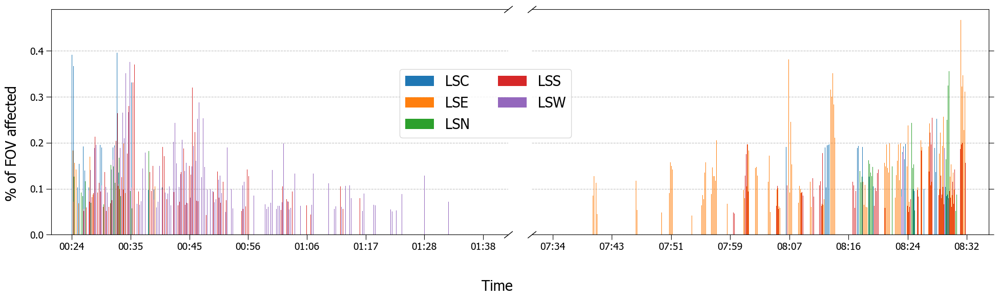

In [70]:
def affected_area_per_camera(savefig=False):

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=[20,6], sharey=True)

    width = 0.25
    n_ticks = 8
    labels = ['LSN', 'LSS', 'LSW', 'LSE', 'LSC']

    for i, (t, ax, values) in enumerate(zip([new_times1, new_times2], [ax1, ax2], [new_camids1, new_camids2])):

        multiplier = 0
        x = np.arange(len(t))

        for (label, vals) in zip(labels, values):
            offset = width * multiplier
            if i==0:
                rects = ax.bar(x+offset, vals, width, label=label, zorder=2, align='edge')
            else:
                rects = ax.bar(x+offset, vals, width, zorder=2, align='edge')
            multiplier += 1

        hours = [dt.hour for dt in t]
        minutes = [dt.minute for dt in t]
        step = len(t) // (n_ticks - 1)
        x_ticks = np.arange(0, len(t), step)
        ax.set_xticks(x_ticks, [f'{hours[i]:02d}:{minutes[i]:02d}' for i in x_ticks])


    ax1.yaxis.tick_left()
    ax2.yaxis.tick_right()
    ax2.tick_params(labelleft=False)
    ax2.spines.left.set_visible(False)
    ax1.spines.right.set_visible(False)
    fig.legend(ncols=2, fontsize=20, loc=(0.4, 0.54))
    fig.supylabel('% of FOV affected', fontsize=20)
    fig.supxlabel('Time', fontsize=20)

    for ax in fig.axes:
        ax.tick_params(axis='both', which='major', length=7, labelsize=14)
        ax.grid(color='gray', axis='y', linestyle='--', alpha=0.5, zorder=1)

    d = 0.8
    kwargs = dict(marker=[(-1, -d), (1, d)], markersize=12, linestyle="none", 
                  color='k', mec='k', mew=1, clip_on=False)
    ax1.plot([1, 1], [1, 0], transform=ax1.transAxes, **kwargs)
    ax2.plot([0, 0], [1, 0], transform=ax2.transAxes, **kwargs)

    plt.tight_layout()
    if savefig:
        plt.savefig(f'{savedir}affected_area_per_camera.png', dpi=300, bbox_inches='tight')
    plt.show()
    
affected_area_per_camera(savefig=False)

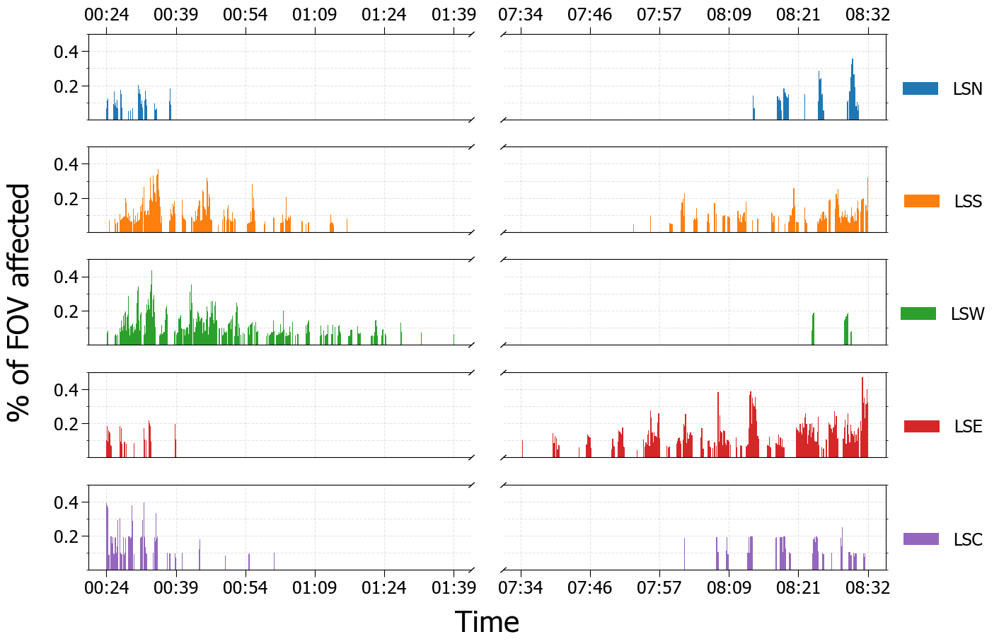

In [295]:
def affected_area_per_camera_separate(savefig=False):

    fig, axs = plt.subplots(5, 2, figsize=[15,10], sharey=True)

    width = 1
    n_ticks = 6
    labels = ['LSN', 'LSS', 'LSW', 'LSE', 'LSC']
    
    x1 = np.arange(len(new_times1))
    h1 = [dt.hour for dt in new_times1]
    m1 = [dt.minute for dt in new_times1]
    step1 = len(h1) // (n_ticks - 1)
    ticks1 = np.arange(0, len(h1), step1)
    
    x2 = np.arange(len(new_times2))
    h2 = [dt.hour for dt in new_times2]
    m2 = [dt.minute for dt in new_times2]
    step2 = len(h2) // (n_ticks - 1)
    ticks2 = np.arange(0, len(h2), step2)

    idx = 0
    for i, ax in enumerate(axs):
    
        vals1 = new_camids1[idx]
        ax[0].bar(x1, vals1, width, zorder=2, color=f'C{i}')
        ax[0].set_xticks(ticks1, [f'{h1[i]:02d}:{m1[i]:02d}' for i in ticks1])
    
        vals2 = new_camids2[idx]
        ax[1].bar(x2, vals2, width, label=labels[idx], zorder=2, color=f'C{i}')
        ax[1].set_xticks(ticks2, [f'{h2[i]:02d}:{m2[i]:02d}' for i in ticks2])

        ax[0].yaxis.tick_left()
        ax[1].yaxis.tick_right()
        ax[1].tick_params(labelleft=False)
        ax[1].spines.left.set_visible(False)
        ax[0].spines.right.set_visible(False)
#         ax[0].tick_params(axis='both', which='major', length=7, labelsize=18, top=True)
#         ax[1].tick_params(axis='both', which='major', length=7, labelsize=18, top=True, right=False)
        ax[0].tick_params(axis='both', which='major', length=7, labelsize=18, top=False, bottom=False)
        ax[1].tick_params(axis='both', which='major', length=7, labelsize=18, top=False, bottom=False, right=False)
        ax[0].grid(color='gray', axis='both', linestyle='--', alpha=0.2, zorder=1)
        ax[1].grid(color='gray', axis='both', linestyle='--', alpha=0.2, zorder=1)
        ax[0].set_ylim([0,0.5])
        ax[0].set_yticks([0.2, 0.4])
        #ax[0].set_yticks([0.1, 0.2, 0.3, 0.4])
        #ax[1].tick_params(axis='y', which='major', direction='in')
        #ax[0].legend(fontsize=18, frameon=True)
        ax[0].yaxis.set_minor_locator(ticker.MultipleLocator(base=0.1))
        ax[0].grid(color='gray', axis='y', which='minor', linestyle='--', alpha=0.2, zorder=1)
        ax[1].grid(color='gray', axis='y', which='minor', linestyle='--', alpha=0.2, zorder=1)
        
        #leg = ax[1].legend(fontsize=16, loc='center', bbox_to_anchor=(0, 0.5))
        leg = ax[1].legend(fontsize=18, loc='center', bbox_to_anchor=(1.15, 0.35), frameon=False)
        #leg.set_in_layout(False)
#         for txt in leg.get_texts():
#             txt.set_ha("center") # horizontal alignment of text item
#             txt.set_x(-210) # x-position
#             txt.set_y(100) # y-position

        d = 0.9
        kwargs = dict(marker=[(-1, -d), (1, d)], markersize=6, linestyle="none", 
                      color='k', mec='k', mew=1, clip_on=False)
        ax[0].plot([1, 1], [1, 0], transform=ax[0].transAxes, **kwargs)
        ax[1].plot([0, 0], [1, 0], transform=ax[1].transAxes, **kwargs)
        
        idx += 1
        
    for ax in axs.ravel()[:8]:
        ax.xaxis.set_tick_params(labelbottom=False)
        
    for ax in axs.ravel()[:2]:
        ax.xaxis.set_tick_params(labeltop=True, top=True)
        
    for ax in axs.ravel()[-2:]:
        ax.xaxis.set_tick_params(bottom=True)

    #fig.legend(ncols=5, fontsize=18, frameon=False, loc='center')
    #fig.supylabel('% of FOV affected', fontsize=20)
    #fig.supxlabel('Time', fontsize=20)
    
    fig.add_subplot(111, frameon=False)
    plt.tick_params(labelcolor='none', which='both', top=False, bottom=False, left=False, right=False)
    plt.xticks([])
    plt.ylabel('% of FOV affected', fontsize=30, labelpad=20)
    plt.xlabel('Time', fontsize=30, labelpad=40)
    plt.tight_layout()
    if savefig:
        plt.savefig(f'{savedir}affected_area_per_camera_separate_2.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    
    
affected_area_per_camera_separate(savefig=False)

In [348]:
def affected_area_per_camera_stacked(savefig=False):

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=[20,6], sharey=True)

    width = 2
    n_ticks = 8
    labels = ['LSC', 'LSE', 'LSN', 'LSS', 'LSW']

    for i, (t, ax, values) in enumerate(zip([new_times1, new_times2], [ax1, ax2], [new_camids1, new_camids2])):

        x = np.arange(len(t))
        bottom = np.zeros_like(t)
        
        for (label, vals) in zip(labels, values):
            if i==0:
                p = ax.bar(x, vals, width, label=label, zorder=2, bottom=bottom)
            else:
                p = ax.bar(x, vals, width, zorder=2, bottom=bottom)
            bottom += vals

        hours = [dt.hour for dt in t]
        minutes = [dt.minute for dt in t]
        step = len(t) // (n_ticks - 1)
        x_ticks = np.arange(0, len(t), step)
        ax.set_xticks(x_ticks, [f'{hours[i]:02d}:{minutes[i]:02d}' for i in x_ticks])


    ax1.yaxis.tick_left()
    ax2.yaxis.tick_right()
    ax2.tick_params(labelleft=False)
    ax2.spines.left.set_visible(False)
    ax1.spines.right.set_visible(False)
    fig.legend(ncols=2, fontsize=20, loc=(0.4, 0.54))
    fig.supylabel('% of FOV affected', fontsize=20)
    fig.supxlabel('Time', fontsize=20)

    for ax in fig.axes:
        ax.tick_params(axis='both', which='major', length=7, labelsize=14)
        ax.grid(color='gray', axis='y', linestyle='--', alpha=0.5, zorder=1)

    d = 0.8
    kwargs = dict(marker=[(-1, -d), (1, d)], markersize=12, linestyle="none", 
                  color='k', mec='k', mew=1, clip_on=False)
    ax1.plot([1, 1], [1, 0], transform=ax1.transAxes, **kwargs)
    ax2.plot([0, 0], [1, 0], transform=ax2.transAxes, **kwargs)

    plt.tight_layout()
    if savefig:
        plt.savefig(f'{savedir}affected_area_per_camera_stacked.png', dpi=300, bbox_inches='tight')
    plt.show()
    
affected_area_per_camera_stacked(savefig=False)

# Line Detection Routines

In [2]:
lstseq = '48506379'
passages = pd.read_pickle(f'{datadir}passages_20221023LSS.p')
data = pf.getdata(f'{testdir}diff_images/LSS/diff_{lstseq}LSS.fits.gz')

from matplotlib.patches import Ellipse

In [3]:
fig, ax = plt.subplots(figsize=[10,6])
ax.imshow(data, vmin=-15, vmax=100, cmap='terrain')

for i, sat in enumerate(list(passages[lstseq])):
    x1, y1 = passages[lstseq][sat]['start']['x'], passages[lstseq][sat]['start']['y']
    x2, y2 = passages[lstseq][sat]['end']['x'], passages[lstseq][sat]['end']['y']
#     ax.scatter([x1,x2], [y1,y2], s=10, c='orange', zorder=1)

    print(i, sat)

    # Center points
    cx = (x1 + x2) / 2
    cy = (y1 + y2) / 2

    # Angle of the track
    delx = x2-x1
    dely = y2-y1
    theta_rad = np.arctan2(dely, delx)
    theta_deg = np.degrees(theta_rad)

    # Length of the track
    tle_length = int(round(np.sqrt((x2 - x1)**2 + (y2 - y1)**2))) #this is based off TLE coords

    # In some cases, e.g. when the line is at the opposite angle, the major and minor axes end up being swapped.
    # This resuls in an incorrect ellipse orientation!
    # Based on the angle of the line, we can determine whether the major axis or the minor axis should be longer.

    if theta_deg % 180 == 0:
        major_axis = int(tle_length/4)
        minor_axis = tle_length + int(tle_length/2)
    else:
        major_axis = tle_length + int(tle_length/2)
        minor_axis = int(tle_length/4)

    e = Ellipse((cx,cy), major_axis, minor_axis, angle=theta_deg, ls='--', color=f'C{i}', lw=0.5, fill=False)
    ax.add_patch(e)

plt.show()

0 44926U
1 44927U
2 49431U
3 51788U


In [4]:
def example_data_lines():

    hx = [[1864, 1886], [1128, 1243], [2014, 2033], [1128, 1241], [1131, 1237], [1130, 1236], [1999, 2040], [1929, 1984], [1433, 1510], [2013, 2031], [1185, 1239], [2000, 2038], [1127, 1242], [2007, 2064], [1388, 1427], [2018, 2039], [1841, 1884], [1840, 1967], [1399, 1422], [2192, 2215], [1366, 1382], [2008, 2034], [1194, 1236], [2102, 2121], [1462, 1511], [1358, 1374], [1931, 1986], [1991, 2008], [1133, 1170], [2189, 2206], [1126, 1231], [1351, 1366], [1748, 1748], [2104, 2121], [1491, 1511], [1433, 1452], [2234, 2252], [1197, 1240], [1351, 1367], [1221, 1238], [1860, 1899], [1126, 1156], [1366, 1382], [1876, 1902], [1956, 1985], [1126, 1145], [1131, 1171]]
    hy = [[1800, 1782], [2195, 2348], [1681, 1665], [2203, 2348], [2195, 2335], [2195, 2336], [1028, 987], [1748, 1703], [2156, 2089], [1680, 1665], [2278, 2348], [1029, 991], [2195, 2348], [1021, 964], [2195, 2160], [1008, 987], [1821, 1787], [1821, 1720], [2184, 2163], [835, 812], [2215, 2199], [1022, 996], [2277, 2333], [925, 906], [2132, 2089], [2221, 2205], [1747, 1704], [1700, 1683], [2196, 2245], [840, 823], [2196, 2334], [2226, 2210], [68, 50], [924, 907], [2108, 2090], [2155, 2138], [794, 776], [2292, 2348], [2227, 2210], [2326, 2348], [1804, 1773], [2197, 2238], [2214, 2198], [1791, 1770], [1726, 1704], [2198, 2224], [2196, 2249]]

    mx = [[1748, 1748], [1351, 1511], [1840, 2033], [2102, 2121], [2189, 2252], [1126, 1243], [1841, 1902], [1999, 2064], [1126, 1171], [1929, 1986]]
    my = [[68, 50], [2227, 2089], [1821, 1665], [925, 906], [840, 776], [2195, 2348], [1821, 1770], [1029, 964], [2196, 2249], [1748, 1703]]

    dx = [[1431, 1512], [1824, 2015], [1999, 2126], [2132, 2272], [1153, 1244], [1824, 1926], [2000, 2131], [1126, 1185], [1927, 2034]]
    dy = [[2157, 2088], [1834, 1679], [1029, 902], [896, 756], [2230, 2347], [1834, 1751], [1029, 896], [2199, 2274], [1751, 1664]]

    return hx, hy, mx, my, dx, dy

hx, hy, mx, my, Dx, Dy = example_data_lines()

In [5]:
mask = pf.getdata(f'{rootdir}noise_reduction_demo/{lstseq}_starsmasked.fits.gz')
mean, median, sigma = aps.sigma_clipped_stats(np.abs(data))

nostarimage = mask.copy()
nostarimage[-30:,:] = 0
nostarimage[:30,:] = 0
nostarimage[:,-30:] = 0
nostarimage[:,:30] = 0

maskim = nostarimage.copy()*0
maskim2 = nostarimage.copy()*0
maskim2[np.abs(nostarimage) > mean+2.5*sigma] = 1
out = cv2.dilate(np.uint8(maskim2),np.ones((3,3),np.uint8))
maskim[(np.abs(nostarimage) > mean+1.0*sigma)] = 1
maskim3 = maskim*out

reducedimage = np.uint8(np.clip(scn.filters.convolve(maskim3,np.ones((3,3))),6,9)-6)

/var/folders/5f/x4x1ls6j1_bgn5_rscqsv6tw0000gn/T/ipykernel_24253/2441666797.py:17: DeprecationWarning: Please use `convolve` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  reducedimage = np.uint8(np.clip(scn.filters.convolve(maskim3,np.ones((3,3))),6,9)-6)


## Reduced, Hough, merge / connect lines

In [6]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=[16,12])

sat = '51788U'
x1, y1 = passages[lstseq][sat]['start']['x'], passages[lstseq][sat]['start']['y']
x2, y2 = passages[lstseq][sat]['end']['x'], passages[lstseq][sat]['end']['y']

ax1.imshow(reducedimage)
ax2.imshow(reducedimage)
ax3.imshow(reducedimage)

for ax in [ax1, ax2, ax3]:
    ax.set_xlim([x2-100, x1+100])
    ax.set_ylim([y2+100, y1-100])
    ax.axis('off')
    
# Center points
cx = (x1 + x2) / 2
cy = (y1 + y2) / 2

# Angle of the track
delx = x2-x1
dely = y2-y1
theta_rad = np.arctan2(dely, delx)
theta_deg = np.degrees(theta_rad)

# Length of the track
tle_length = int(round(np.sqrt((x2 - x1)**2 + (y2 - y1)**2))) #this is based off TLE coords

if theta_deg % 180 == 0:
    major_axis = int(tle_length/4)
    minor_axis = tle_length + int(tle_length/2)
else:
    major_axis = tle_length + int(tle_length/2)
    minor_axis = int(tle_length/4)

e1 = Ellipse((cx,cy), major_axis, minor_axis, angle=theta_deg, ls='--', color='w', lw=2, fill=False, alpha=0)
ax2.add_patch(e1)
e2 = Ellipse((cx,cy), major_axis, minor_axis, angle=theta_deg, ls='--', color='w', lw=2, fill=False, alpha=0)
ax3.add_patch(e2)

cols = ['red', 'lightskyblue', 'yellow', 'orange', 'hotpink', 'c', 'm', 'limegreen', 'w', 'peachpuff']
    
x_segment, y_segment = [], []
for x, y in zip(hx, hy):
    dx1, dx2 = x[0], x[1]
    dy1, dy2 = y[0], y[1]
    if e1.contains_point(ax2.transData.transform([dx1,dy1])) and e1.contains_point(ax2.transData.transform([dx2,dy2])):
        x_segment.append([dx1, dx2])
        y_segment.append([dy1, dy2])
for i, (x, y) in enumerate(zip(x_segment, y_segment)):
    ax2.plot(x, y, lw=2, c=cols[i])
print(len(x_segment))        


x_segment, y_segment = [], []
for x, y in zip(mx, my):
    dx1, dx2 = x[0], x[1]
    dy1, dy2 = y[0], y[1]
    if e2.contains_point(ax3.transData.transform([dx1,dy1])) and e2.contains_point(ax3.transData.transform([dx2,dy2])):
        x_segment.append([dx1, dx2])
        y_segment.append([dy1, dy2])
for i, (x, y) in enumerate(zip(x_segment, y_segment)):
    ax3.plot(x, y, lw=2, c=cols[i])
print(len(x_segment))   


plt.show()

10
3


In [204]:
def line_detection_example_1(imgtype='reduced'):

    fig, ax = plt.subplots(1, 1, figsize=[6,4])

    sat = '51788U'
    x1, y1 = passages[lstseq][sat]['start']['x'], passages[lstseq][sat]['start']['y']
    x2, y2 = passages[lstseq][sat]['end']['x'], passages[lstseq][sat]['end']['y']

    ax.imshow(reducedimage)
    ax.set_xlim([x2-100, x1+100])
    ax.set_ylim([y2+100, y1-100])
    ax.axis('off')
    
    if imgtype!='reduced':

        cx = (x1 + x2) / 2
        cy = (y1 + y2) / 2
        delx = x2-x1
        dely = y2-y1
        theta_rad = np.arctan2(dely, delx)
        theta_deg = np.degrees(theta_rad)
        tle_length = int(round(np.sqrt((x2 - x1)**2 + (y2 - y1)**2))) 

        if theta_deg % 180 == 0:
            major_axis = int(tle_length/4)
            minor_axis = tle_length + int(tle_length/2)
        else:
            major_axis = tle_length + int(tle_length/2)
            minor_axis = int(tle_length/4)

        e = Ellipse((cx,cy), major_axis, minor_axis, angle=theta_deg, ls='--', color='w', lw=2, fill=False, alpha=0)
        ax.add_patch(e)

        cols = ['red', 'lightskyblue', 'yellow', 'orange', 'hotpink', 'c', 'm', 'limegreen', 'w', 'peachpuff']
        
        if imgtype=='hough':
            
            x_segment, y_segment = [], []
            for x, y in zip(hx, hy):
                dx1, dx2 = x[0], x[1]
                dy1, dy2 = y[0], y[1]
                if e.contains_point(ax.transData.transform([dx1,dy1])) and e.contains_point(ax.transData.transform([dx2,dy2])):
                    x_segment.append([dx1, dx2])
                    y_segment.append([dy1, dy2])
            for i, (x, y) in enumerate(zip(x_segment, y_segment)):
                ax.plot(x, y, lw=2, c=cols[i])
            print(len(x_segment))        

        else:
            x_segment, y_segment = [], []
            for x, y in zip(mx, my):
                dx1, dx2 = x[0], x[1]
                dy1, dy2 = y[0], y[1]
                if e.contains_point(ax.transData.transform([dx1,dy1])) and e.contains_point(ax.transData.transform([dx2,dy2])):
                    x_segment.append([dx1, dx2])
                    y_segment.append([dy1, dy2])
            for i, (x, y) in enumerate(zip(x_segment, y_segment)):
                ax.plot(x, y, lw=2, c=cols[i])
            print(len(x_segment))   

    plt.tight_layout()
    plt.savefig(f'{savedir}line_detection_{imgtype}.png', bbox_inches='tight', dpi=300)
    plt.show()


In [207]:
line_detection_example_1(imgtype='hough')

10


## RANSAC, endpoints, TLE correlation

In [9]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=[16,12])

sat = '51788U'
x1, y1 = passages[lstseq][sat]['start']['x'], passages[lstseq][sat]['start']['y']
x2, y2 = passages[lstseq][sat]['end']['x'], passages[lstseq][sat]['end']['y']

ax1.imshow(reducedimage)
ax2.imshow(reducedimage)
ax3.imshow(reducedimage)

for ax in [ax1, ax2, ax3]:
    ax.set_xlim([x2-100, x1+100])
    ax.set_ylim([y2+100, y1-100])
    ax.axis('off')
    
# Center points
cx = (x1 + x2) / 2
cy = (y1 + y2) / 2

# Angle of the track
delx = x2-x1
dely = y2-y1
theta_rad = np.arctan2(dely, delx)
theta_deg = np.degrees(theta_rad)

# Length of the track
tle_length = int(round(np.sqrt((x2 - x1)**2 + (y2 - y1)**2))) #this is based off TLE coords

if theta_deg % 180 == 0:
    major_axis = int(tle_length/4)
    minor_axis = tle_length + int(tle_length/3)
else:
    major_axis = tle_length + int(tle_length/3)
    minor_axis = int(tle_length/4)

e1 = Ellipse((cx,cy), major_axis, minor_axis, angle=theta_deg, ls=':', color='w', lw=2, fill=False, alpha=0)
ax1.add_patch(e1)
e2 = Ellipse((cx,cy), major_axis, minor_axis, angle=theta_deg, ls=':', color='w', lw=2, fill=False)
ax2.add_patch(e2)


cols = ['w', 'red', 'yellow', 'orange', 'hotpink', 'c', 'm', 'limegreen', 'lightcoral', 'peachpuff']
    
x_segment, y_segment = [], []
for x, y in zip(Dx, Dy):
    dx1, dx2 = x[0], x[1]
    dy1, dy2 = y[0], y[1]
    if e1.contains_point(ax1.transData.transform([dx1,dy1])) and e1.contains_point(ax1.transData.transform([dx2,dy2])):
        x_segment.append([dx1, dx2])
        y_segment.append([dy1, dy2])
for i, (x, y) in enumerate(zip(x_segment, y_segment)):
    ax1.plot(x, y, lw=2, c=cols[i])
    
x_segment, y_segment = [], []
for x, y in zip(Dx, Dy):
    dx1, dx2 = x[0], x[1]
    dy1, dy2 = y[0], y[1]
    if e2.contains_point(ax2.transData.transform([dx1,dy1])) and e2.contains_point(ax2.transData.transform([dx2,dy2])):
        x_segment.append([dx1, dx2])
        y_segment.append([dy1, dy2])
for i, (x, y) in enumerate(zip(x_segment, y_segment)):
    ax2.plot(x, y, lw=2, c=cols[i])
    
x1_segment, y1_segment = [], []
x2_segment, y2_segment = [], []
for x, y in zip(Dx, Dy):
    dx1, dx2 = x[0], x[1]
    dy1, dy2 = y[0], y[1]
    if e2.contains_point(ax2.transData.transform([dx1,dy1])) and e2.contains_point(ax2.transData.transform([dx2,dy2])):
        x1_segment.append(dx1)
        x2_segment.append(dx2)
        y1_segment.append(dy1)
        y2_segment.append(dy2)
        
if x1_segment[0] < x2_segment[0]:
    # Satellite (maybe*) moving to the right 
    xmin, xmax = min(x1_segment), max(x2_segment)
else:
    # Satellite (maybe*) moving to the left 
    xmin, xmax = max(x1_segment), min(x2_segment)

if y1_segment[0] < y2_segment[0]:
    # Satellite (maybe*) moving downwards
    ymin, ymax = min(y1_segment), max(y2_segment)
else:
    # Satellite (maybe*) moving upwards
    ymin, ymax = max(y1_segment), min(y2_segment)
    
# Distance from (x_min, y_min) to start of TLE track (i.e. start of negative segment):
d1 = int(round(np.sqrt((x1 - xmin)**2. + (y1 - ymin)**2.)))
d2 = int(round(np.sqrt((x1 - xmax)**2. + (y1 - ymax)**2.)))
if d1 < d2:
    # hence min corresponds to start of negative segment, max to end of positive segment
    x_min, x_max = xmin, xmax
    y_min, y_max = ymin, ymax
else:
    x_min, x_max = xmax, xmin
    y_min, y_max = ymax, ymin
                
ax2.scatter([x1,x2], [y1,y2], s=50, c='C1', zorder=5)
ax3.plot([x_min, x_max], [y_min, y_max], zorder=2, c='orange', lw=2, ls=':')
ax3.scatter([x_min, x_max], [y_min, y_max], zorder=2, c='w', s=75, marker='+')


plt.show()

In [8]:
def line_detection_example_2(imgtype='ransac'):

    fig, ax = plt.subplots(1, 1, figsize=[6,4])

    sat = '51788U'
    x1, y1 = passages[lstseq][sat]['start']['x'], passages[lstseq][sat]['start']['y']
    x2, y2 = passages[lstseq][sat]['end']['x'], passages[lstseq][sat]['end']['y']

    ax.imshow(reducedimage)
    ax.set_xlim([x2-100, x1+100])
    ax.set_ylim([y2+100, y1-100])
    ax.axis('off')
    
    cx = (x1 + x2) / 2
    cy = (y1 + y2) / 2
    delx = x2-x1
    dely = y2-y1
    theta_rad = np.arctan2(dely, delx)
    theta_deg = np.degrees(theta_rad)
    tle_length = int(round(np.sqrt((x2 - x1)**2 + (y2 - y1)**2))) #this is based off TLE coords

    if theta_deg % 180 == 0:
        major_axis = int(tle_length/4)
        minor_axis = tle_length + int(tle_length/3)
    else:
        major_axis = tle_length + int(tle_length/3)
        minor_axis = int(tle_length/4)

    a = 0
    if imgtype=='ellipse':
        a = 1
        ax.scatter([x1,x2], [y1,y2], s=50, c='limegreen', zorder=5)
        
    e = Ellipse((cx,cy), major_axis, minor_axis, angle=theta_deg, ls=':', color='w', lw=2, fill=False, alpha=a)
    ax.add_patch(e)

    cols = ['red', 'lightskyblue', 'yellow', 'orange', 'hotpink', 'c', 'm', 'limegreen', 'lightcoral', 'peachpuff']

    if imgtype!='final':
        
        x_segment, y_segment = [], []
        for x, y in zip(Dx, Dy):
            dx1, dx2 = x[0], x[1]
            dy1, dy2 = y[0], y[1]
            if e.contains_point(ax.transData.transform([dx1,dy1])) and e.contains_point(ax.transData.transform([dx2,dy2])):
                x_segment.append([dx1, dx2])
                y_segment.append([dy1, dy2])
        for i, (x, y) in enumerate(zip(x_segment, y_segment)):
            j = 3-i
            ax.plot(x, y, c=cols[i], zorder=i, lw=j)

    else:
        x1_segment, y1_segment = [], []
        x2_segment, y2_segment = [], []
        for x, y in zip(Dx, Dy):
            dx1, dx2 = x[0], x[1]
            dy1, dy2 = y[0], y[1]
            if e.contains_point(ax.transData.transform([dx1,dy1])) and e.contains_point(ax.transData.transform([dx2,dy2])):
                x1_segment.append(dx1)
                x2_segment.append(dx2)
                y1_segment.append(dy1)
                y2_segment.append(dy2)

        if x1_segment[0] < x2_segment[0]:
            # Satellite (maybe*) moving to the right 
            xmin, xmax = min(x1_segment), max(x2_segment)
        else:
            # Satellite (maybe*) moving to the left 
            xmin, xmax = max(x1_segment), min(x2_segment)

        if y1_segment[0] < y2_segment[0]:
            # Satellite (maybe*) moving downwards
            ymin, ymax = min(y1_segment), max(y2_segment)
        else:
            # Satellite (maybe*) moving upwards
            ymin, ymax = max(y1_segment), min(y2_segment)

        # Distance from (x_min, y_min) to start of TLE track (i.e. start of negative segment):
        d1 = int(round(np.sqrt((x1 - xmin)**2. + (y1 - ymin)**2.)))
        d2 = int(round(np.sqrt((x1 - xmax)**2. + (y1 - ymax)**2.)))
        if d1 < d2:
            # hence min corresponds to start of negative segment, max to end of positive segment
            x_min, x_max = xmin, xmax
            y_min, y_max = ymin, ymax
        else:
            x_min, x_max = xmax, xmin
            y_min, y_max = ymax, ymin
        
        ax.plot([x_min, x_max], [y_min, y_max], zorder=2, c='orange', lw=2, ls=':')
        ax.scatter([x_min, x_max], [y_min, y_max], zorder=2, c='w', s=75, marker='+')


    plt.tight_layout()
    plt.savefig(f'{savedir}line_detection_{imgtype}.png', bbox_inches='tight', dpi=300)
    plt.show()

In [10]:
line_detection_example_2(imgtype='ellipse')

In [ ]:
for i, sat in enumerate(list(passages[lstseq])):
    print('Looking for ' + sat)
    x1, y1 = passages[lstseq][sat]['start']['x'], passages[lstseq][sat]['start']['y']
    x2, y2 = passages[lstseq][sat]['end']['x'], passages[lstseq][sat]['end']['y']
    ax.scatter([x1,x2], [y1,y2], s=10, c='orange', zorder=1)

    # Center points
    cx = (x1 + x2) / 2
    cy = (y1 + y2) / 2

    # Angle of the track
    delx = x2-x1
    dely = y2-y1
    theta_rad = np.arctan2(dely, delx)
    theta_deg = np.degrees(theta_rad)


    # Length of the track
    tle_length = int(round(np.sqrt((x2 - x1)**2 + (y2 - y1)**2))) #this is based off TLE coords

    # In some cases, e.g. when the line is at the opposite angle, the major and minor axes end up being swapped.
    # This resuls in an incorrect ellipse orientation!
    # Based on the angle of the line, we can determine whether the major axis or the minor axis should be longer.

    if theta_deg % 180 == 0:
        major_axis = int(tle_length/4)
        minor_axis = tle_length + int(tle_length/3)
    else:
        major_axis = tle_length + int(tle_length/3)
        minor_axis = int(tle_length/4)


    e = Ellipse((cx,cy), major_axis, minor_axis, angle=theta_deg, ls='--', color='w', lw=0.5, fill=False)
    ax.add_patch(e)

    # Lines from dtermine_endpoints
    x1_segment, x2_segment = [], []
    y1_segment, y2_segment = [], []

    cols = ['m', 'r', 'orange', 'y', 'w', 'g', 'b', 'k', 'pink', 'c', 'brown', 'lime', 'gray', 'blueviolet', 'gold']
    for x, y in zip(Dx, Dy):
        dx1, dx2 = x[0], x[1]
        dy1, dy2 = y[0], y[1]

        # Check to see if line bounded by ellipse (need to transform the coord system!)
        if e.contains_point(ax.transData.transform([dx1,dy1])) and e.contains_point(ax.transData.transform([dx2,dy2])):

            # All (x,y)-coords from Ransac within ellipse
            x1_segment.append(dx1)
            y1_segment.append(dy1)
            x2_segment.append(dx2)
            y2_segment.append(dy2)
            
    if len(x1_segment) == 0:
        print('Routine failed; could not determine end-points')
        continue            
            
    # Track orientation - this is already determined by the determine_endpoints routine but we do it again our way since 
    # we want to collapse the segments into one continuous line (min and max points will therefore be different)
    # This caused quite the headache to do, but the below routine works (although not very elegant)

    if x1_segment[0] < x2_segment[0]:
        # Satellite (maybe*) moving to the right 
        xmin, xmax = min(x1_segment), max(x2_segment)
    else:
        # Satellite (maybe*) moving to the left 
        xmin, xmax = max(x1_segment), min(x2_segment)

    if y1_segment[0] < y2_segment[0]:
        # Satellite (maybe*) moving downwards
        ymin, ymax = min(y1_segment), max(y2_segment)
    else:
        # Satellite (maybe*) moving upwards
        ymin, ymax = max(y1_segment), min(y2_segment)


    # * Since we're unsure whether the min or max points correspond to the start of the negative segment or the end of 
    # the positive segment, these coords could be reversed. So, we determine this by checking which point is closest to 
    # the negative or positive segment by comparing the distance to the TLE coord:


    # Distance from (x_min, y_min) to start of TLE track (i.e. start of negative segment):
    d1 = int(round(np.sqrt((x1 - xmin)**2. + (y1 - ymin)**2.)))
    d2 = int(round(np.sqrt((x1 - xmax)**2. + (y1 - ymax)**2.)))
    if d1 < d2:
        # hence min corresponds to start of negative segment, max to end of positive segment
        x_min, x_max = xmin, xmax
        y_min, y_max = ymin, ymax
    else:
        x_min, x_max = xmax, xmin
        y_min, y_max = ymax, ymin

    # Just to clarify: 
    # min coords = entry points (LSTSEQ1, negative segment)
    # max coords = exit points (LSTSEQ2, positive segment)


    # Length of track as determined by the line segment
    fotos_length = int(round(np.sqrt((x_max - x_min)**2. + (y_max - y_min)**2.)))

    """

    Some instances where lines are still found for tracks that are ver much not complete i.e. lines being extracted
    that are very short relative to the true length of the track. We will add a condition such that, if the line
    segment (fotos_length) is less than 1/3 the size of the true segment (tle_length), then we'll skip it and not 
    do the brightness magnitude calculation for it!

    """

    if fotos_length < int(round(tle_length/3)):
        print('Determined line segment too short')
        continue


# Comparison to Zwicky

In [4]:
df.type.unique()

array(['visorsat', 'standard', 'darksat'], dtype=object)

In [13]:
print(np.mean(df[df.type == 'visorsat'].vmag_norm_550))
print(np.mean(df[df.type == 'visorsat'].delta))

print(np.mean(df[(df.type == 'standard') | (df.type == 'darksat')].vmag_norm_550))
print(np.mean(df[(df.type == 'standard') | (df.type == 'darksat')].delta))

4.285848596069637
0.10157835870814394
4.57418799515895
0.09498337190049014


In [14]:
# Transformation

def G_to_V(g, delta):
    v = g + 0.235024
    d = delta + 0.38
    return v, d

nonvisor_v, nonvisor_d = G_to_V(5.16, 0.02)
visor_v, visor_d = G_to_V(6.77, 0.03)

print(nonvisor_v, nonvisor_d)
print(visor_v, visor_d)

5.395024 0.4
7.005024 0.41000000000000003


# Poster

In [22]:
df[df.vmag < 3.1]

,satnum,satname,vmag,delta,flux,JD0,JD1,camid,type,version,...,inc,alt,az,range,ra,dec,height,phase_angle,vmag_norm_550,vmag_norm_1000
129,48667U,STARLINK-2735,1.701046,0.037194,1.462721e+06,2.459877e+06,2.459877e+06,LSC,visorsat,1.0,...,53.0550,77.679071,151.853346,566.996017,6.423381,-39.900884,557.364652,98.813268,1.634959,2.933146
130,48667U,STARLINK-2735,1.799344,0.035396,1.322480e+06,2.459877e+06,2.459877e+06,LSC,visorsat,1.0,...,53.0550,73.235964,148.238712,577.654312,6.721807,-42.971473,557.480617,94.552634,1.692817,2.991004
131,48667U,STARLINK-2735,2.356315,0.054077,7.582070e+05,2.459877e+06,2.459877e+06,LSC,visorsat,1.0,...,53.0550,68.934283,146.176755,591.489897,7.036821,-45.741065,557.596579,90.457914,2.198392,3.496579
132,48667U,STARLINK-2735,2.432808,0.044841,7.386911e+05,2.459877e+06,2.459877e+06,LSC,visorsat,1.0,...,53.0550,64.824468,144.844392,608.285029,7.365856,-48.180031,557.712519,86.560162,2.214086,3.512273
146,48669U,STARLINK-2707,2.379391,0.031534,8.045272e+05,2.459877e+06,2.459877e+06,LSC,visorsat,1.0,...,53.0558,60.760807,102.542980,628.063049,7.998848,-31.204396,557.194620,82.713230,2.091188,3.389375
147,48669U,STARLINK-2707,2.637416,0.035191,6.493485e+05,2.459877e+06,2.459877e+06,LSC,visorsat,1.0,...,53.0558,57.748495,107.264466,646.046520,8.250812,-33.401401,557.310771,79.240401,2.287910,3.586097
305,46056U,STARLINK-1561,2.525505,0.052098,6.465506e+05,2.459877e+06,2.459877e+06,LSE,visorsat,1.0,...,53.0556,48.479022,49.759543,718.262740,7.840703,0.496920,556.529061,90.953269,1.945901,3.244088
306,46056U,STARLINK-1561,2.509198,0.048905,6.540409e+05,2.459877e+06,2.459877e+06,LSE,visorsat,1.0,...,53.0556,48.457040,55.355178,718.626861,8.022207,-2.051378,556.641970,87.772692,1.928495,3.226681
307,46056U,STARLINK-1561,2.483198,0.047492,6.632463e+05,2.459877e+06,2.459877e+06,LSE,visorsat,1.0,...,53.0556,48.150689,60.887995,721.758337,8.204195,-4.571457,556.755058,84.600681,1.893052,3.191239
308,46056U,STARLINK-1561,2.432221,0.050120,6.565285e+05,2.459877e+06,2.459877e+06,LSE,visorsat,1.0,...,53.0556,47.575148,66.258924,727.621370,8.386020,-7.039585,556.868301,81.463753,1.824507,3.122693


In [15]:
df.columns

Index(['satnum', 'satname', 'vmag', 'delta', 'flux', 'JD0', 'JD1', 'camid',
       'type', 'version', 'annulus', 'launch', 'sun_alt', 'sun_az', 'inc',
       'alt', 'az', 'range', 'ra', 'dec', 'height', 'phase_angle',
       'vmag_norm_550', 'vmag_norm_1000'],
      dtype='object')

# September 23rd

In [16]:
def trail_example(data, i=1, savefig=False):
    
    norm = (data - np.min(data)) / (np.max(data) - np.min(data))
    sqrt_image = np.sqrt(norm)

    threshold = 0.35#0.185
    sqrt_thresholded = np.clip(sqrt_image, 0, threshold)
    
    fig, ax = plt.subplots(figsize=(10, 6))
    ax.imshow(sqrt_thresholded, cmap='binary_r')
    ax.axis('off')
    
    plt.tight_layout()
    if savefig:
        plt.savefig(f'{savedir}trail_raw_{i}.png', dpi=300, bbox_inches='tight')
        plt.close()
    else:
        plt.show()

In [17]:
files = sorted(glob.glob(f'{rootdir}poster/lse/*'))

In [19]:
for i, file in enumerate(files, start=1):
    data = pf.getdata(file)
    trail_example(data, i, savefig=True)